# Rainfall Prediction - Weather Forecasting (Evaluation Project - 8)

Problem Statement:
    
    Rain Prediction –Weather forecasting

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia.

Here, predict two things:

1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

  b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.



Dataset Description:

Number of columns: 23


Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".



Downlaod Files:
    
https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv

https://github.com/dsrscientist/dataset3

# Importing Liabraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings 
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split

# Importing Data

In [2]:
data = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")
data

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
data.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [5]:
# Checking shape

data.shape

(8425, 23)

Observation:
    
    Dataset consist of 8425rows and 23 columns.

In [6]:
# Checking columns name

data.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [8]:
data.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

# Checking Duplicate

In [9]:
data.duplicated().sum()

1663

There are 1663 duplicate present in dataset drop them.

In [10]:
data.drop_duplicates(keep= 'first',inplace= True )

In [11]:
data.shape

(6762, 23)

In [12]:
# Checking duplicate after removal

data.duplicated().sum()

0

Observation:
    Now dataset is free from duplicates.

# Statistical Summary

In [13]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6692.000000,6705.000000,6624.000000,3841.000000,3526.000000,5820.000000,6699.000000,6662.000000,6708.000000,6666.000000,5454.000000,5451.000000,4896.000000,4860.000000,6711.000000,6670.000000
mean,13.109145,24.098345,2.780148,5.302395,7.890896,38.977663,12.782206,17.571150,67.506559,50.467147,1017.626311,1015.119923,4.336806,4.320988,17.895038,22.708561
std,5.569574,6.156128,10.591418,4.436790,3.785883,14.418577,9.833499,9.620043,17.251733,18.631086,6.712043,6.646755,2.908324,2.740519,5.744117,6.012896
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.500000,0.000000,2.600000,5.400000,30.000000,6.000000,9.000000,56.000000,38.000000,1013.100000,1010.300000,1.000000,1.000000,13.800000,18.300000
50%,13.200000,23.500000,0.000000,4.600000,9.000000,37.000000,11.000000,17.000000,68.000000,50.000000,1017.600000,1015.100000,5.000000,5.000000,18.000000,22.100000
75%,17.500000,28.400000,0.800000,7.000000,10.800000,48.000000,19.000000,24.000000,81.000000,63.000000,1022.200000,1019.600000,7.000000,7.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


In [14]:
data.describe(include=object).T

,count,unique,top,freq
Date,6762,3004,2011-02-11,4
Location,6762,12,PerthAirport,1204
WindGustDir,5820,16,E,518
WindDir9am,5968,16,N,609
WindDir3pm,6468,16,SE,677
RainToday,6624,2,No,5052
RainTomorrow,6624,2,No,5052


Observation:
    Skweness is present in dataset.
    There are Outliers present in data.
    Date column has 3004 unique values need to encoded it to numerical values.


In [15]:
data['Date'] = pd.to_datetime(data['Date'])
data['year'] = data['Date'].dt.year
data['month'] = data['Date'].dt.month
data['day'] = data['Date'].dt.day

In [16]:
data.drop('Date', axis = 1, inplace = True)
data.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


# Spliting Numerical and Categorical Data

In [17]:
data.columns.to_series().groupby(data.dtypes).groups

{int64: ['year', 'month', 'day'], float64: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'], object: ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']}

In [18]:
# spliting Numerical & Categorical


num_features = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 
                'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
                'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm' ]

cat_features = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       6762 non-null   object 
 1   MinTemp        6692 non-null   float64
 2   MaxTemp        6705 non-null   float64
 3   Rainfall       6624 non-null   float64
 4   Evaporation    3841 non-null   float64
 5   Sunshine       3526 non-null   float64
 6   WindGustDir    5820 non-null   object 
 7   WindGustSpeed  5820 non-null   float64
 8   WindDir9am     5968 non-null   object 
 9   WindDir3pm     6468 non-null   object 
 10  WindSpeed9am   6699 non-null   float64
 11  WindSpeed3pm   6662 non-null   float64
 12  Humidity9am    6708 non-null   float64
 13  Humidity3pm    6666 non-null   float64
 14  Pressure9am    5454 non-null   float64
 15  Pressure3pm    5451 non-null   float64
 16  Cloud9am       4896 non-null   float64
 17  Cloud3pm       4860 non-null   float64
 18  Temp9am 

Observation: There are total 16 float datatype, 3 int datatype and 6 categorical datatype.
Two target variables are there Rainfall and RainTomorrow.
Rainfall has a numerical data,and RainTomorrow has a categorical data.

# Checking for  'NA', '-' or space in dataset

In [20]:
data.isin([' ','NA','-']).sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
year             0
month            0
day              0
dtype: int64

Observation: There is no such values present in dataset.

# Checking Null Values

In [21]:
# Checking nul values

#checking null values

null_val= data.isna().sum()
null_val_per =(null_val/data.shape[0])*100
l= [null_val, null_val_per]
print("missing value details \n\n", pd.concat(l, axis =1, keys =['Null Values', 'Null Values percentage']).sort_values('Null Values'))

missing value details 

                Null Values  Null Values percentage
Location                 0                0.000000
year                     0                0.000000
month                    0                0.000000
day                      0                0.000000
Temp9am                 51                0.754215
Humidity9am             54                0.798580
MaxTemp                 57                0.842946
WindSpeed9am            63                0.931677
MinTemp                 70                1.035197
Temp3pm                 92                1.360544
Humidity3pm             96                1.419698
WindSpeed3pm           100                1.478852
Rainfall               138                2.040816
RainTomorrow           138                2.040816
RainToday              138                2.040816
WindDir3pm             294                4.347826
WindDir9am             794               11.742088
WindGustDir            942               13.930790
WindGu

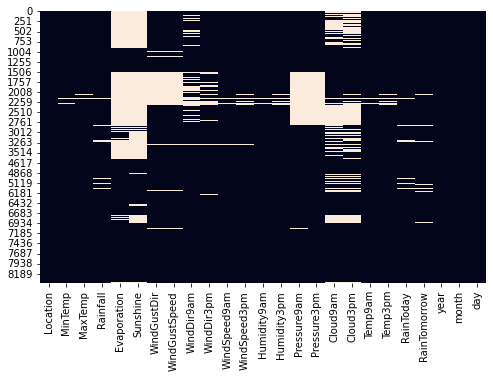

In [22]:
plt.figure(figsize=(8,5))
sns.heatmap(data.isnull(),cbar=False)
plt.show()

Observation:There are Null values present in  every feature of the dataset.
Target variable has  null values.


# Imputing Null values

Imputing Categorical data

In [23]:
cat= data[['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday','RainTomorrow']]
for i in cat:
    print("Mode of ",i)
    mode = data[i].mode()[0]
    print(mode)
    print("--------")


Mode of  WindGustDir
E
--------
Mode of  WindDir9am
N
--------
Mode of  WindDir3pm
SE
--------
Mode of  RainToday
No
--------
Mode of  RainTomorrow
No
--------


In [24]:
for i in cat:
    mode = data[i].mode()[0]
    data[i].fillna(mode,inplace=True)

Observation: In categorical data no null value is present.


Imputing Numerical Data

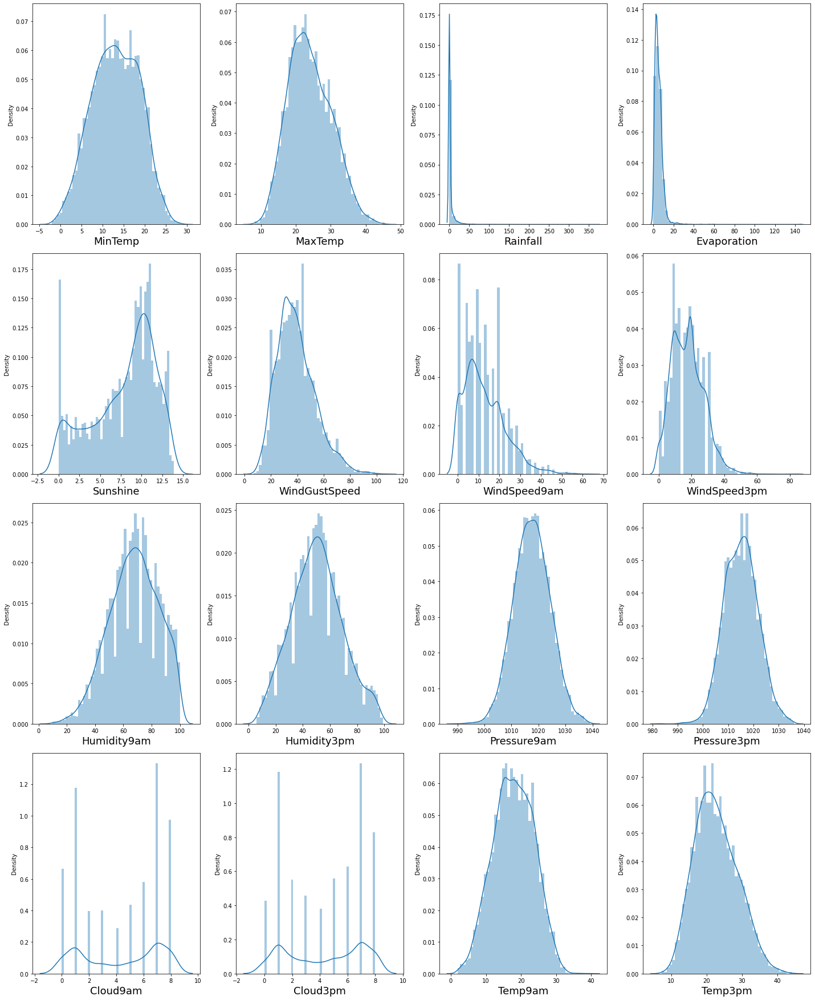

In [25]:
num= ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 
    'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
    'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
i=0
plt.figure(figsize=(20,30))
for x in num:
    plt.subplot(5,4,i+1)
    sns.distplot(data[x], bins=50)
    plt.xlabel(x,fontsize=18)
    i=i+1
plt.tight_layout()


# Checking Outliers

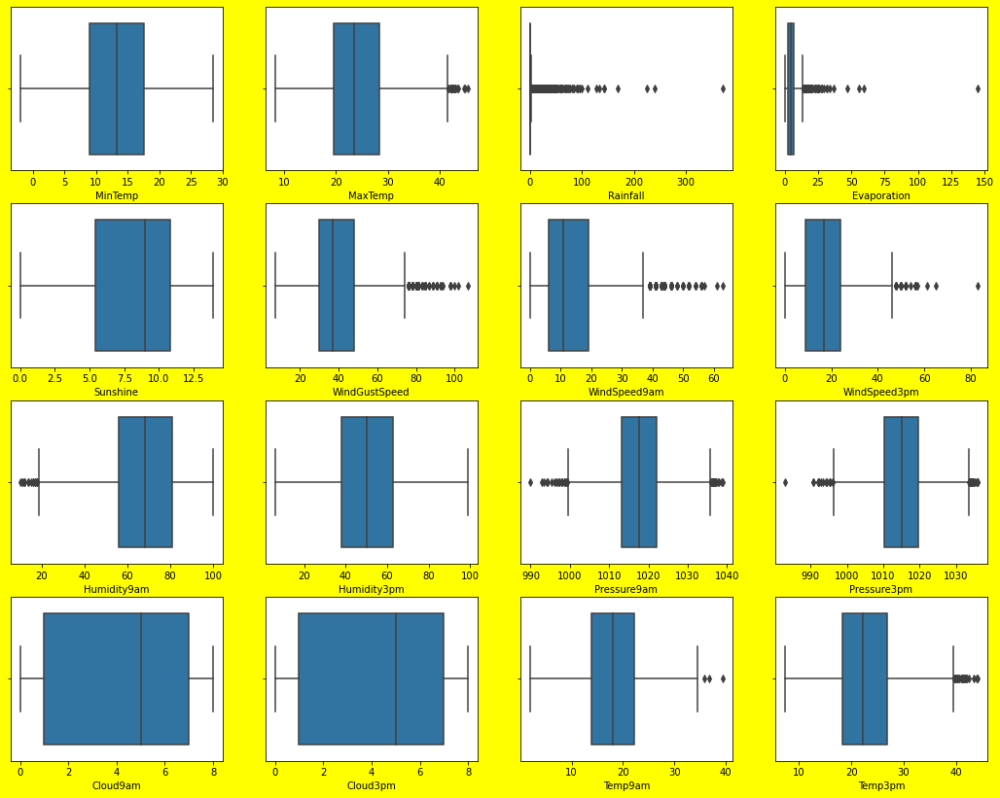

In [26]:
num= ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 
    'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
    'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
plt.figure(figsize=(18,18),facecolor='yellow')
plotnumber=1

for x in num:
    if plotnumber<=16:
        ax=plt.subplot(5,4,plotnumber)
        sns.boxplot(data[x])
        plt.xlabel(x)
    plotnumber+=1
plt.show()

Observation: There are Outliers present in dataset.

# Removing Outliers

In [27]:
# Using Quantile method

#1st quantile
q1= data. quantile(0.1)
#3rd quantile
q3= data. quantile(0.85)
#IQR
iqr= q3-q1

In [28]:
data_new = data[~((data < (q1 - 1.5 *iqr)) |(data > (q3 + 1.5 *iqr))).any(axis=1)]
print(data_new.shape)

(6192, 25)


In [29]:
data.shape

(6762, 25)

In [30]:
# Data Loss
((data.shape[0] - data_new.shape[0])/data.shape[0])*100

8.429458740017747

Observation: After loosing 8.4% data removed all the outliers from dataset.


Now Imputing Numerical Data

In [31]:
data_new[num].isnull().sum()

MinTemp            64
MaxTemp            55
Rainfall          138
Evaporation      2677
Sunshine         2974
WindGustSpeed     859
WindSpeed9am       56
WindSpeed3pm       93
Humidity9am        51
Humidity3pm        91
Pressure9am      1202
Pressure3pm      1205
Cloud9am         1773
Cloud3pm         1801
Temp9am            48
Temp3pm            87
dtype: int64

In [32]:
num= ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 
    'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
    'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
for i in num:
    print("Mean of ",i,'is')
    mean = data_new[i].mean()
    print(mean)
    print("--------")

Mean of  MinTemp is
12.938071148825086
--------
Mean of  MaxTemp is
24.245853022649488
--------
Mean of  Rainfall is
0.7717707300958002
--------
Mean of  Evaporation is
5.112290184921756
--------
Mean of  Sunshine is
8.143039154754529
--------
Mean of  WindGustSpeed is
38.47515469716857
--------
Mean of  WindSpeed9am is
12.61848109517601
--------
Mean of  WindSpeed3pm is
17.42711919986883
--------
Mean of  Humidity9am is
66.29815990880964
--------
Mean of  Humidity3pm is
49.15423701032618
--------
Mean of  Pressure9am is
1017.8531062124224
--------
Mean of  Pressure3pm is
1015.2447563665517
--------
Mean of  Cloud9am is
4.130798823263182
--------
Mean of  Cloud3pm is
4.164882714643589
--------
Mean of  Temp9am is
17.88948567708335
--------
Mean of  Temp3pm is
22.86570024570026
--------


In [33]:
for i in num:
    mean = data_new[i].mean()
    data_new[i].fillna(mean,inplace=True)

# Exploratory Data Analysis

Categorical Data Analysis

In [34]:
cat= ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']
for i in cat:
    x= data_new[i].value_counts()
    print("Value counts of", i, "is---\n",x)
    print("="*20)


Value counts of Location is---
 PerthAirport    1119
Albury           844
Melbourne        761
Newcastle        751
CoffsHarbour     537
Williamtown      531
Brisbane         523
Penrith          449
Darwin           236
Wollongong       212
Adelaide         190
Uluru             39
Name: Location, dtype: int64
Value counts of WindGustDir is---
 E      1345
N       436
SW      413
W       403
WNW     365
WSW     363
SSE     343
ENE     342
S       334
SE      331
NE      283
NNE     274
NW      272
SSW     272
ESE     243
NNW     173
Name: WindGustDir, dtype: int64
Value counts of WindDir9am is---
 N      1313
SW      509
NW      430
SE      407
ENE     382
NE      345
WSW     331
E       324
NNE     322
SSW     321
S       284
SSE     281
WNW     269
W       265
ESE     207
NNW     202
Name: WindDir9am, dtype: int64
Value counts of WindDir3pm is---
 SE     877
WSW    456
NE     456
S      449
SW     391
SSE    375
NW     366
E      359
WNW    358
W      358
N      335
ESE    329
ENE  

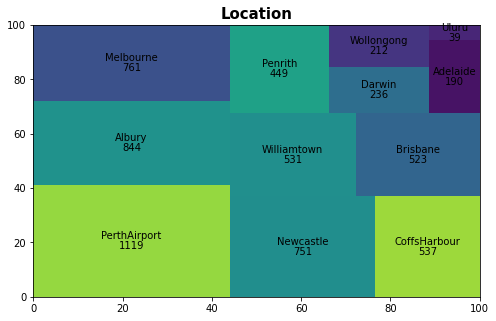

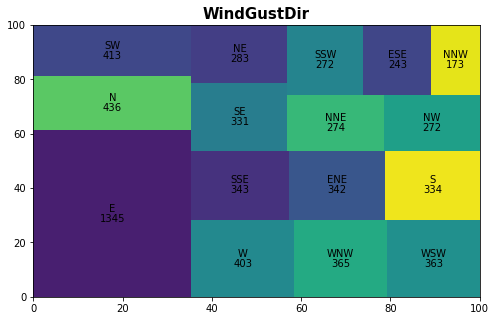

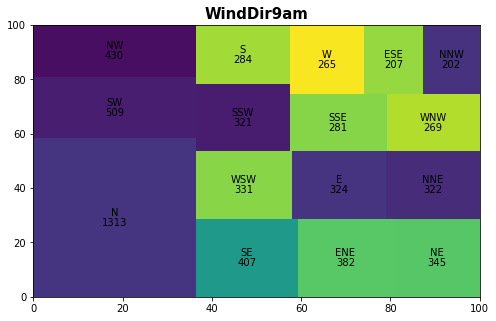

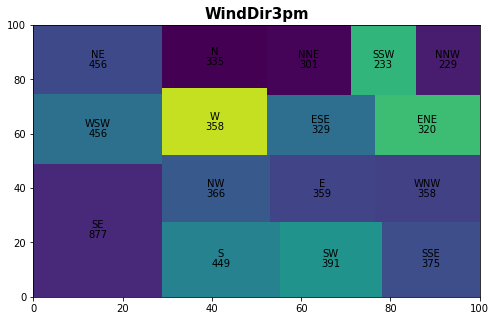

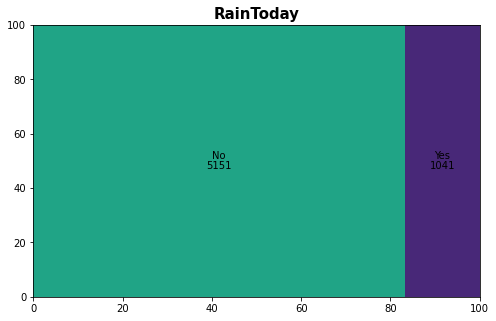

In [35]:
import squarify
for i in cat:
    plt.figure(figsize=(8,5))
    reln = data_new[i].value_counts()
    squarify.plot(sizes=reln.values, value=reln.values, label=reln.index)
    plt.title(i, fontdict={'fontsize': 15, 'fontweight': 'bold'})
    plt.show()

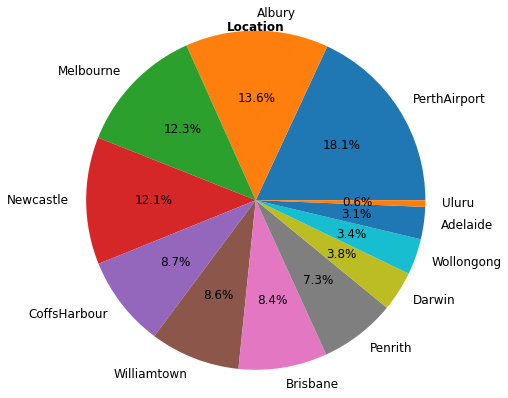

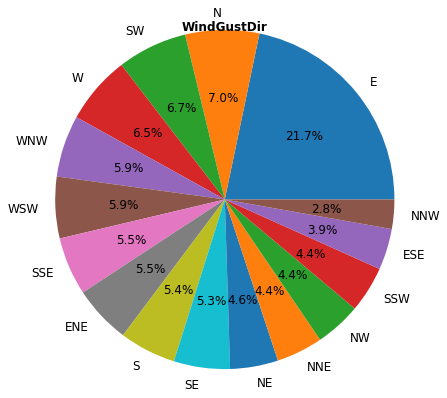

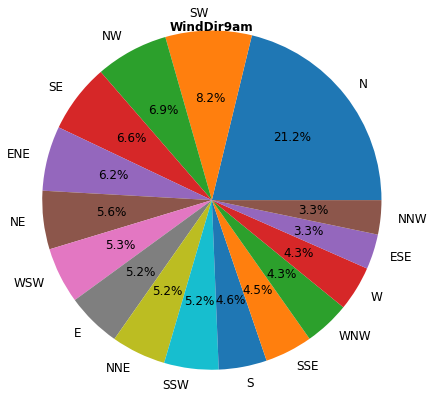

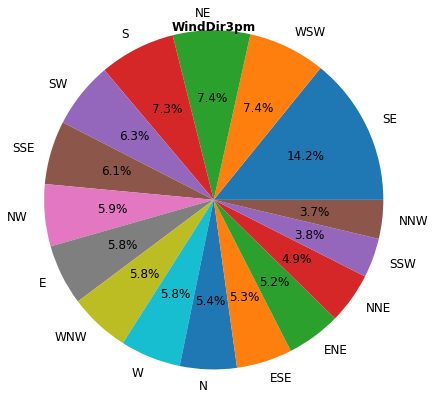

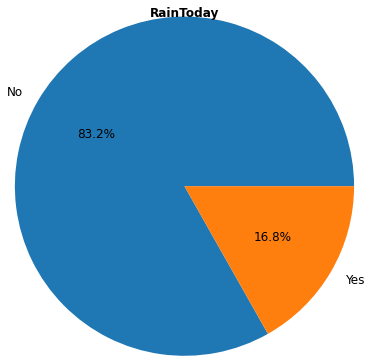

In [36]:
for i in cat:
    plt.figure(figsize=(6,6))
    data_new[i].value_counts().plot.pie(radius =1.3, textprops ={ 'fontsize':12}, autopct='%2.1f%%')
    plt.title(i,fontsize =12,fontweight ='bold')
    plt.ylabel(' ')
    plt.show()

Observation: 
RainToday has percentage of 'NO' is 83.2%. 
WindDir9am is N (North) is 21%.
WindDir3pm is SE (South East) is 14%.
Maximum WindGustDir is E that is the direction of the strongest wind gust in the 24 hours to midnight is East direction.


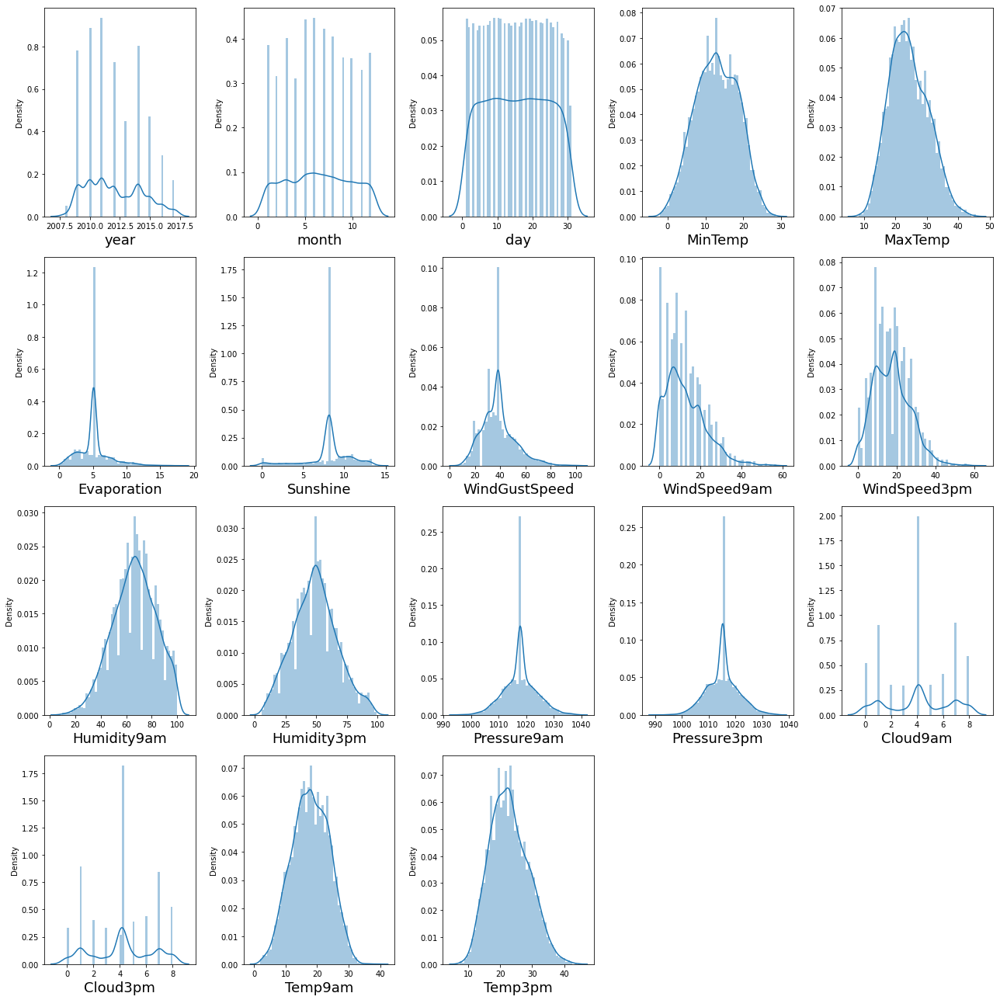

In [37]:
num= ['year', 'month', 'day', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 
      'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
      'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
i=0
plt.figure(figsize=(18,18))
for x in num:
    plt.subplot(4,5,i+1)
    sns.distplot(data_new[x], bins=50)
    plt.xlabel(x,fontsize=18)
    i=i+1
plt.tight_layout()


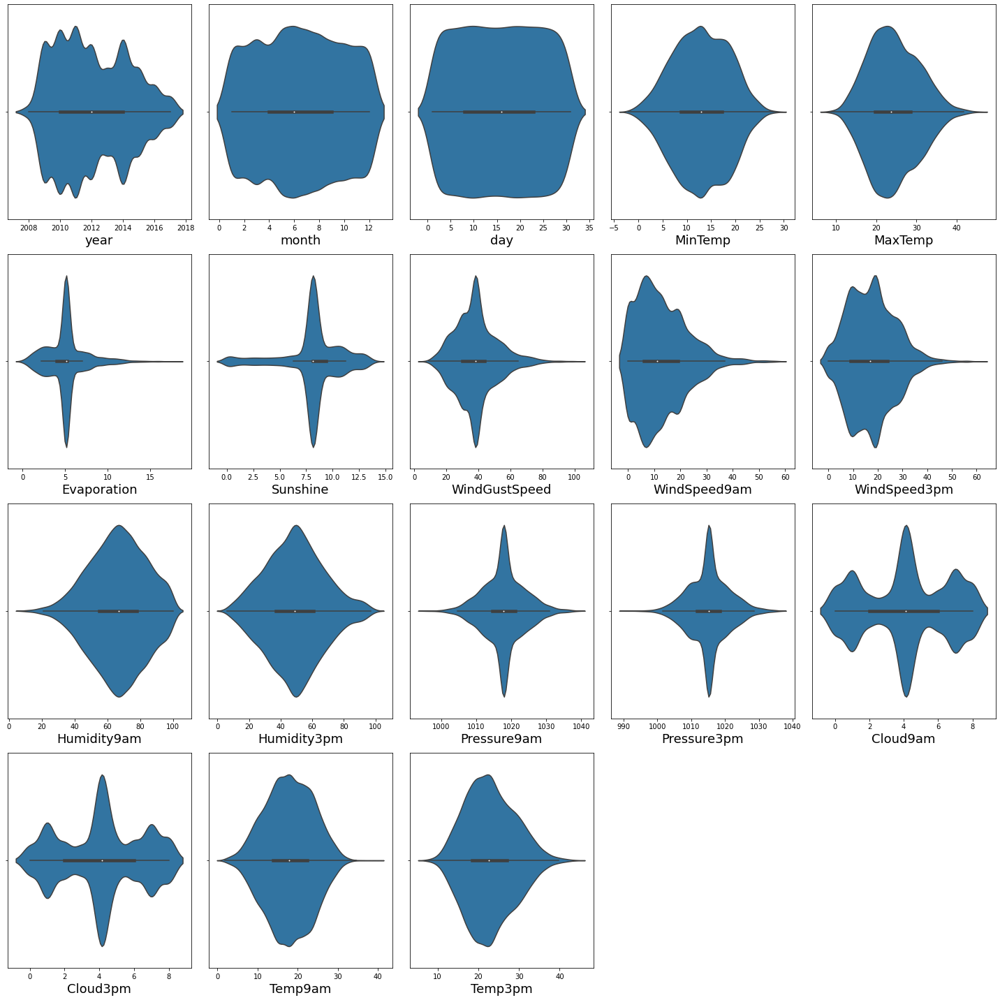

In [38]:
num= ['year', 'month', 'day', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 
      'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
      'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
i=0
plt.figure(figsize=(20,20))
for x in num:
    plt.subplot(4,5,i+1)
    sns.violinplot(data_new[x])
    plt.xlabel(x,fontsize=18)
    i=i+1
plt.tight_layout()

Observation: 
Range of Min temp is 0-25.

Range of MaxTemp is 10-40.Range of WindGustSpeed is 10-80.

Humidity9am and Humidity3pm is in the range of 0-100.

Pressure9am and Pressure3pm isin the range of 1000-1030.

Range of WindGustSpeed is 10-80.

Range of for both variation is 0-40.

The evaporation value is 5 in maximum cases.


# Analysing Target

# Target-1 (RainTomorrow)

In [39]:
data_new["RainTomorrow"].value_counts()

No     4938
Yes    1254
Name: RainTomorrow, dtype: int64

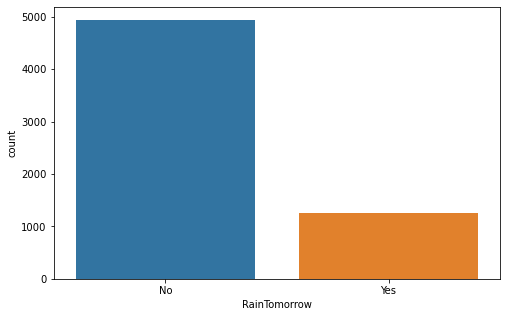

In [40]:
plt.figure(figsize=(8,5))
sns.countplot(data_new["RainTomorrow"])
plt.show()

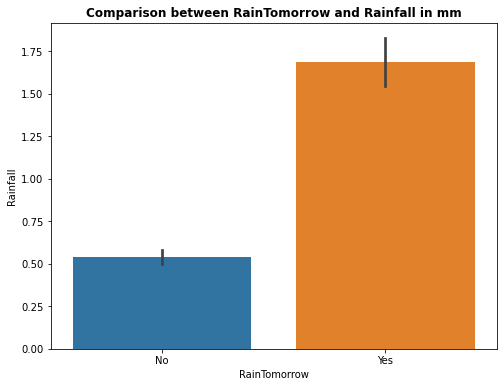

In [41]:
plt.figure(figsize=(8,6))
sns.barplot(x = "RainTomorrow", y = "Rainfall", data = data_new)
plt.title('Comparison between RainTomorrow and Rainfall in mm', fontsize=12, fontweight='bold')
plt.show()

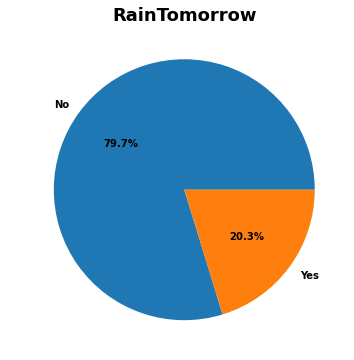

In [42]:
plt.subplots(figsize=(8,6))
data_new['RainTomorrow'].value_counts().plot.pie(autopct='%2.1f%%', textprops ={ 'fontweight': 'bold','fontsize':10})
plt.title('RainTomorrow', fontsize=18,fontweight ='bold')
plt.ylabel( ' ')
plt.show()

Observation:
    
There are Outliers present in the dataset.
    
Dataset is imbalance with respect to target variable 1 which is RainTomorrow.
79% data has No outcomes for Raintomorrow.
If rainfall range in between 0-0.50, the chance for raining tomorrow is No.


# Target - 2 (Rainfall)

In [43]:
print('Maximum Rainfall value is:',data_new.Rainfall.max(),"mm")
print('Minimum Rainfall value is:',data_new.Rainfall.min(),"mm")
print('Mean Rainfall value is:',data_new.Rainfall.mean(),"mm")
print('Sum of the Rainfall value is:',data_new.Rainfall.sum(),"mm")

Maximum Rainfall value is: 10.0 mm
Minimum Rainfall value is: 0.0 mm
Mean Rainfall value is: 0.7717707300957997 mm
Sum of the Rainfall value is: 4778.80436075322 mm


In [44]:
print ('The number of values with maximum Rainfall', data_new['Rainfall'].value_counts()[10.0])


The number of values with maximum Rainfall 10


In [45]:
print ('The number of values with minimum Rainfall', data_new['Rainfall'].value_counts()[0.0])


The number of values with minimum Rainfall 4299


In [46]:
print(" Details of maximum Rainfall value which is 10.0 mm:\n")


 Details of maximum Rainfall value which is 10.0 mm:



In [47]:
data_new.loc[data_new.Rainfall==10.0]

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
675,Albury,7.3,15.9,10.0,5.11229,8.143039,WSW,46.000000,W,WSW,...,1020.700000,4.130799,4.164883,10.0,15.5000,Yes,No,2010,10,7
1130,CoffsHarbour,12.0,22.6,10.0,6.00000,11.900000,E,28.000000,WSW,E,...,1024.400000,2.000000,2.000000,19.2,22.0000,Yes,No,2009,10,19
1345,CoffsHarbour,11.4,21.0,10.0,3.60000,9.100000,SW,35.000000,SW,SE,...,1015.244756,1.000000,4.164883,16.8,22.8657,Yes,No,2010,5,22
1852,Newcastle,10.8,21.0,10.0,5.11229,8.143039,E,38.475155,N,SE,...,1015.244756,5.000000,6.000000,15.2,20.1000,Yes,No,2014,5,9
2052,Newcastle,22.2,28.7,10.0,5.11229,8.143039,E,38.475155,N,SE,...,1015.244756,8.000000,8.000000,25.5,21.8000,Yes,No,2014,11,25
2209,Newcastle,12.7,20.4,10.0,5.11229,8.143039,E,38.475155,N,SE,...,1015.244756,8.000000,7.000000,16.0,18.5000,Yes,Yes,2015,5,1
2436,Penrith,9.1,20.9,10.0,5.11229,8.143039,NNE,17.000000,N,ESE,...,1015.244756,4.130799,4.164883,11.7,20.1000,Yes,No,2014,8,24
2873,Williamtown,18.7,26.2,10.0,8.80000,8.143039,WSW,48.000000,SSE,ESE,...,1011.100000,7.000000,7.000000,23.4,24.0000,Yes,Yes,2015,12,10
6445,Brisbane,21.3,32.9,10.0,3.20000,10.200000,W,33.000000,SSW,W,...,999.100000,6.000000,4.000000,27.2,32.4000,Yes,No,2011,12,12
7101,PerthAirport,10.3,19.5,10.0,2.20000,4.900000,WSW,48.000000,NNE,WNW,...,1017.000000,7.000000,5.000000,13.2,17.2000,Yes,Yes,2011,6,15


Observation: 
Range of Max and Min rainfall is 0 mm to 10.0 mm.
Number of data with maximum Rainfall (10.0 mm) is 10.
Newcastle and CoffsHarbour has Most of the time 10.0 mm rainfall.

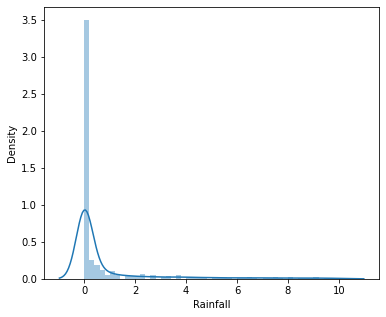

In [48]:
plt.figure(figsize=(6,5))
sns.distplot(data_new.Rainfall)
plt.show()

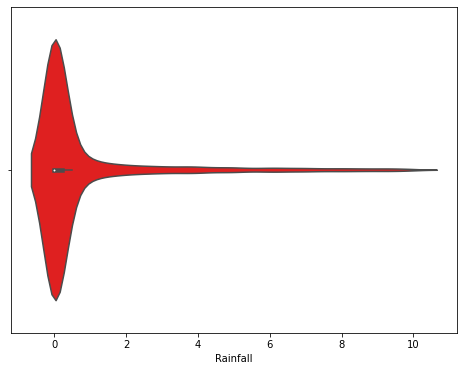

In [49]:
plt.figure(figsize=(8,6))
sns.violinplot(data_new.Rainfall, color='red')
plt.show()

Observation:In maximum cases rainfall is zero.

In [50]:
rain0 = data_new.loc[data_new.Rainfall == 0].shape
rain0

(4299, 25)

In [51]:
# percentage of Rainfall =0:
print ("Percentage of Rainfall eual to 0 mm is:", rain0[0]/data_new.shape[0]*100,"%")


Percentage of Rainfall eual to 0 mm is: 69.42829457364341 %


In [52]:
data_new["Rainfall"].groupby(data_new["WindDir9am"]).agg([min, max, sum])


,min,max,sum
WindDir9am,,,
E,0.0,9.6,109.743541
ENE,0.0,7.8,115.715312
ESE,0.0,9.4,106.487083
N,0.0,10.0,1035.786141
NE,0.0,9.8,196.558854
NNE,0.0,10.0,251.315312
NNW,0.0,9.6,146.602395
NW,0.0,9.2,253.245937
S,0.0,9.4,222.617707


In [53]:
data_new["Rainfall"].groupby(data_new["Location"]).agg([min, max, sum])


,min,max,sum
Location,,,
Adelaide,0.0,8.8,144.287083
Albury,0.0,10.0,583.145937
Brisbane,0.0,10.0,358.858854
CoffsHarbour,0.0,10.0,528.771771
Darwin,0.0,8.2,81.400000
Melbourne,0.0,9.6,714.106244
Newcastle,0.0,10.0,654.004790
Penrith,0.0,10.0,360.515312
PerthAirport,0.0,10.0,742.200000


Observation:
In 70% cases rainfall is zero.
WindDir9am is North(N) has maximum rainfall(1035mm) and Uluru has lowest rainfall.

# Checking RainTomorrow vs Other features

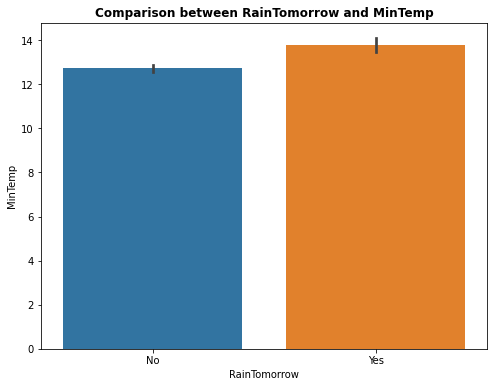

In [54]:
plt.figure(figsize=(8,6))
sns.barplot(x = "RainTomorrow", y = "MinTemp", data = data_new)
plt.title('Comparison between RainTomorrow and MinTemp', fontsize=12, fontweight='bold')
plt.show()


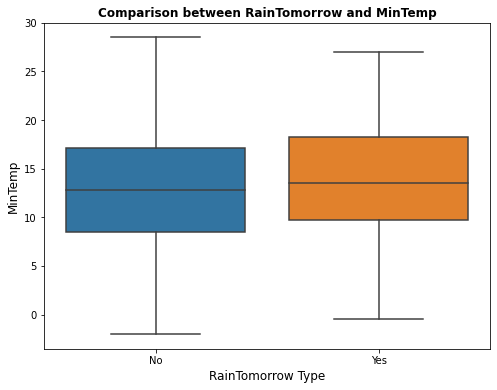

In [55]:
plt.figure(figsize=[8,6])
plt.title('Comparison between RainTomorrow and MinTemp',fontsize=12, fontweight= "bold")
a = sns.boxplot(data_new['RainTomorrow'],data_new["MinTemp"])
a.set_xlabel('RainTomorrow Type',fontsize=12)
a.set_ylabel('MinTemp',fontsize=12)
plt.show()

Observation: There is no specific relation between RainTomorrow and MinTemp.


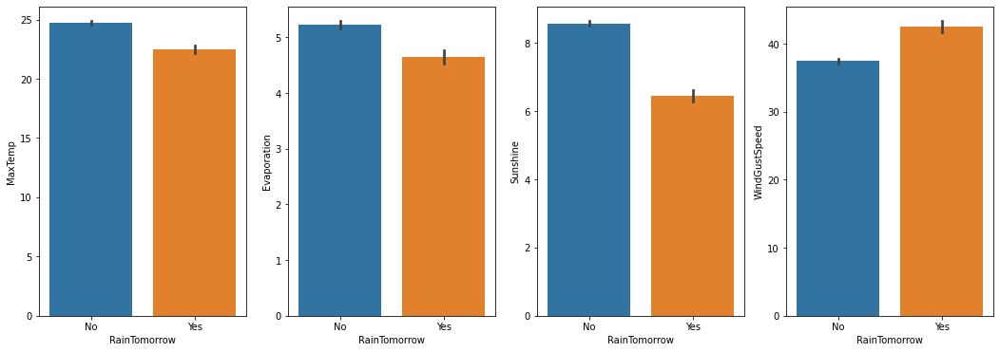

In [56]:
f,ax=plt.subplots(1,4,figsize=(18,6))
sns.barplot(x = "RainTomorrow", y = "MaxTemp", data = data_new, ax=ax[0])
sns.barplot(x = "RainTomorrow", y = "Evaporation",data=data_new, ax=ax[1])
sns.barplot(x = "RainTomorrow", y = "Sunshine", data = data_new, ax=ax[2])
sns.barplot(x = "RainTomorrow", y = "WindGustSpeed",data=data_new, ax=ax[3])
plt.show()

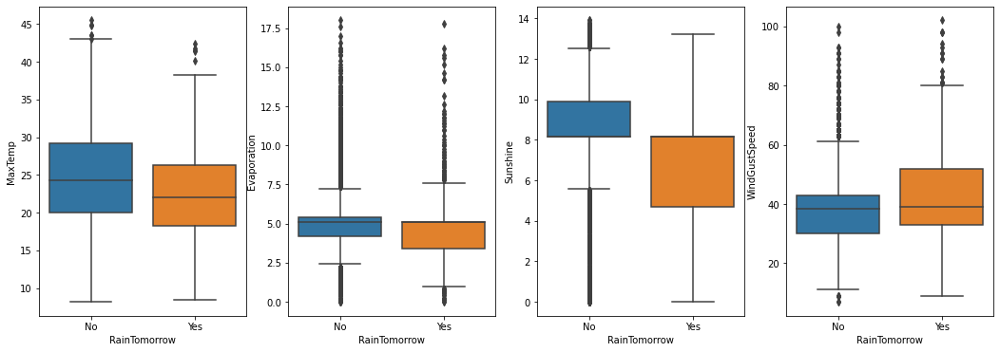

In [57]:
f,ax=plt.subplots(1,4,figsize=(18,6))
sns.boxplot(x = "RainTomorrow", y = "MaxTemp", data = data_new, ax=ax[0])
sns.boxplot(x = "RainTomorrow", y = "Evaporation",data=data_new, ax=ax[1])
sns.boxplot(x = "RainTomorrow", y = "Sunshine", data = data_new, ax=ax[2])
sns.boxplot(x = "RainTomorrow", y = "WindGustSpeed",data=data_new, ax=ax[3])
plt.show()

Observation: The sunshine level is around 6 for RainTomorrow= Yes and about 8 for RainTomorrow=No.
Avg WindGustSpeed is slightly less for RainTomorrow= No than RainTomorrow= Yes.


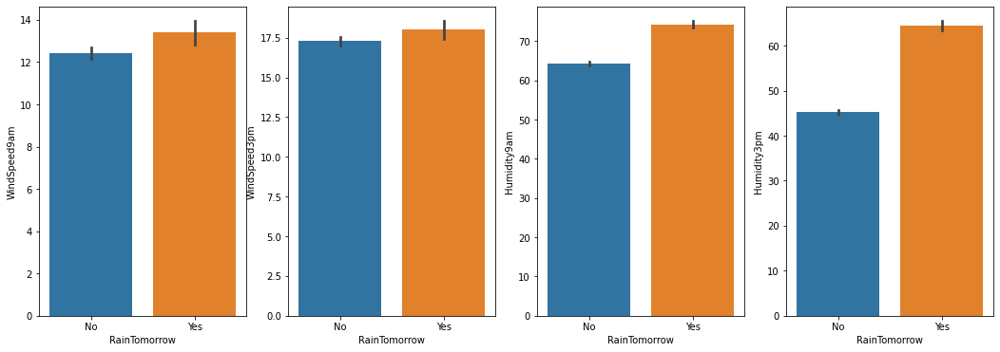

In [58]:
f,ax=plt.subplots(1,4,figsize=(18,6))
sns.barplot(x = "RainTomorrow", y = "WindSpeed9am", data = data_new, ax=ax[0])
sns.barplot(x = "RainTomorrow", y = "WindSpeed3pm",data=data_new, ax=ax[1])
sns.barplot(x = "RainTomorrow", y = "Humidity9am", data = data_new, ax=ax[2])
sns.barplot(x = "RainTomorrow", y = "Humidity3pm",data=data_new, ax=ax[3])
plt.show()

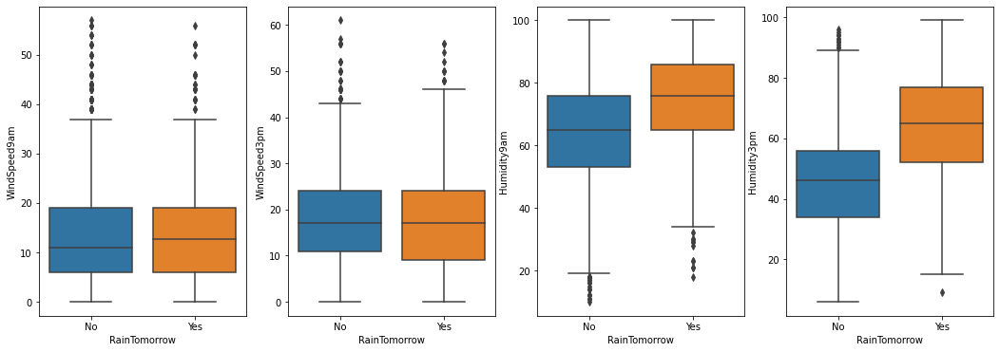

In [59]:
f,ax=plt.subplots(1,4,figsize=(18,6))
sns.boxplot(x = "RainTomorrow", y = "WindSpeed9am", data = data_new, ax=ax[0])
sns.boxplot(x = "RainTomorrow", y = "WindSpeed3pm",data=data_new, ax=ax[1])
sns.boxplot(x = "RainTomorrow", y = "Humidity9am", data = data_new, ax=ax[2])
sns.boxplot(x = "RainTomorrow", y = "Humidity3pm",data=data_new, ax=ax[3])
plt.show()

Observation:There is no such relaion between WindSpeed and RainTomorrow.
For Humidity level is 40 than RainTomorrow is No and for Humidity level is around 60, RainTomorrow is Yes.
For high Humidity level, the raining tendency will be high.


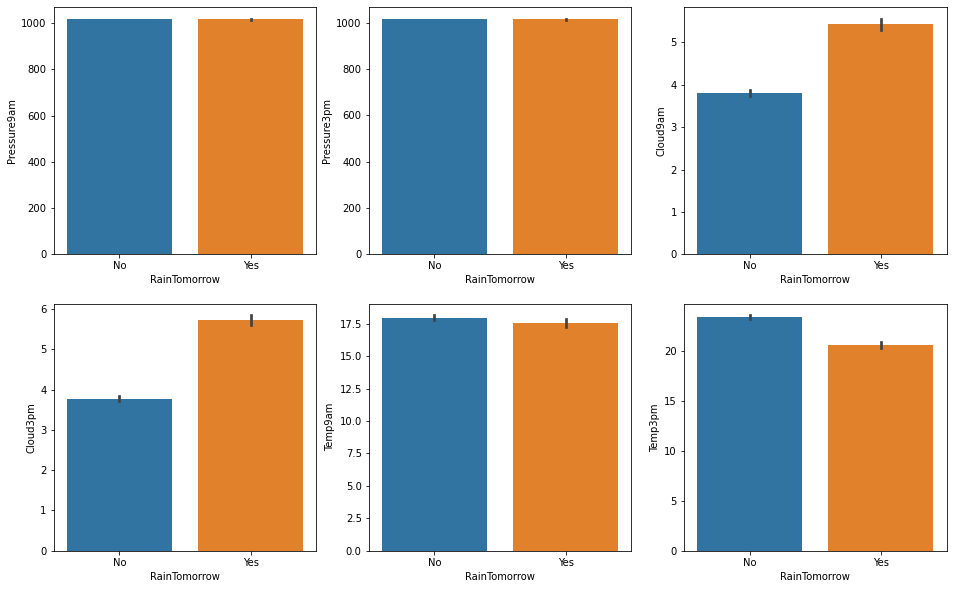

In [60]:
f,ax=plt.subplots(2,3,figsize=(16,10))
sns.barplot(x = "RainTomorrow", y = "Pressure9am", data = data_new, ax=ax[0,0])
sns.barplot(x = "RainTomorrow", y = "Pressure3pm",data=data_new, ax=ax[0,1])
sns.barplot(x = "RainTomorrow", y = "Cloud9am", data = data_new, ax=ax[0,2])
sns.barplot(x = "RainTomorrow", y = "Cloud3pm",data=data_new, ax=ax[1,0])
sns.barplot(x = "RainTomorrow", y = "Temp9am", data = data_new, ax=ax[1,1])
sns.barplot(x = "RainTomorrow", y = "Temp3pm",data=data_new, ax=ax[1,2])
plt.show()

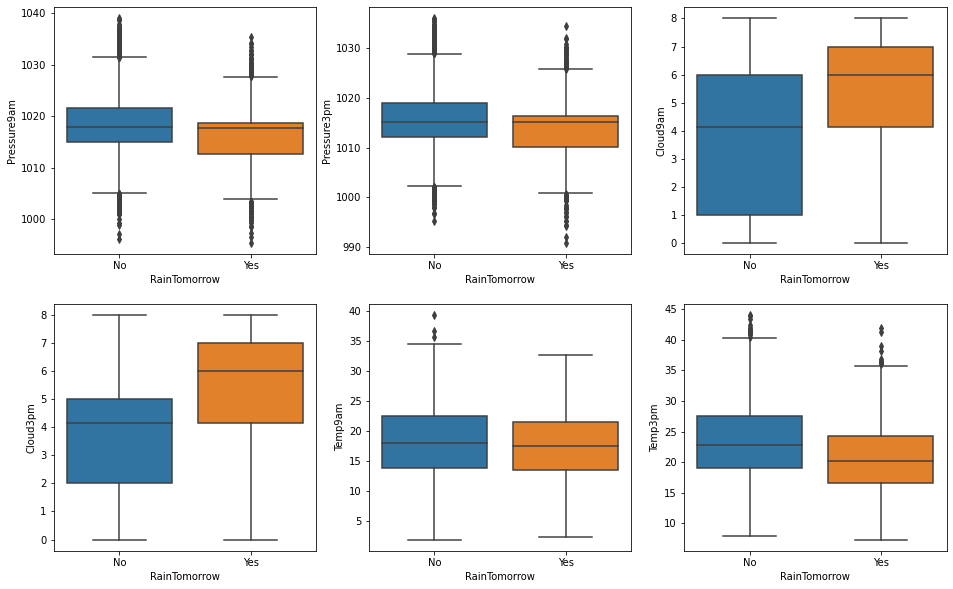

In [61]:
f,ax=plt.subplots(2,3,figsize=(16,10))
sns.boxplot(x = "RainTomorrow", y = "Pressure9am", data = data_new, ax=ax[0,0])
sns.boxplot(x = "RainTomorrow", y = "Pressure3pm",data=data_new, ax=ax[0,1])
sns.boxplot(x = "RainTomorrow", y = "Cloud9am", data = data_new, ax=ax[0,2])
sns.boxplot(x = "RainTomorrow", y = "Cloud3pm",data=data_new, ax=ax[1,0])
sns.boxplot(x = "RainTomorrow", y = "Temp9am", data = data_new, ax=ax[1,1])
sns.boxplot(x = "RainTomorrow", y = "Temp3pm",data=data_new, ax=ax[1,2])
plt.show()

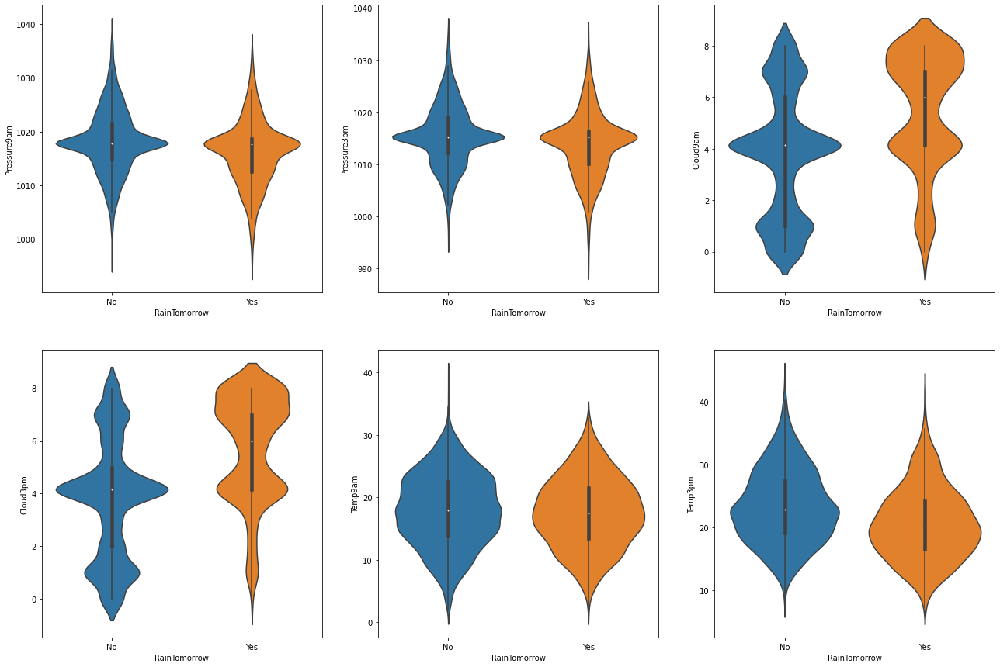

In [62]:
f,ax=plt.subplots(2,3,figsize=(22,15))
sns.violinplot(x = "RainTomorrow", y = "Pressure9am", data = data_new, ax=ax[0,0])
sns.violinplot(x = "RainTomorrow", y = "Pressure3pm",data=data_new, ax=ax[0,1])
sns.violinplot(x = "RainTomorrow", y = "Cloud9am", data = data_new, ax=ax[0,2])
sns.violinplot(x = "RainTomorrow", y = "Cloud3pm",data=data_new, ax=ax[1,0])
sns.violinplot(x = "RainTomorrow", y = "Temp9am", data = data_new, ax=ax[1,1])
sns.violinplot(x = "RainTomorrow", y = "Temp3pm",data=data_new, ax=ax[1,2])

plt.show()

Observation:There is no relaion between Pressure and RainTomorrow.
There is no relaion between Temparature and RainTomorrow.
If Fraction of sky obscured by cloud is around 3-4 level, raining probability is No.


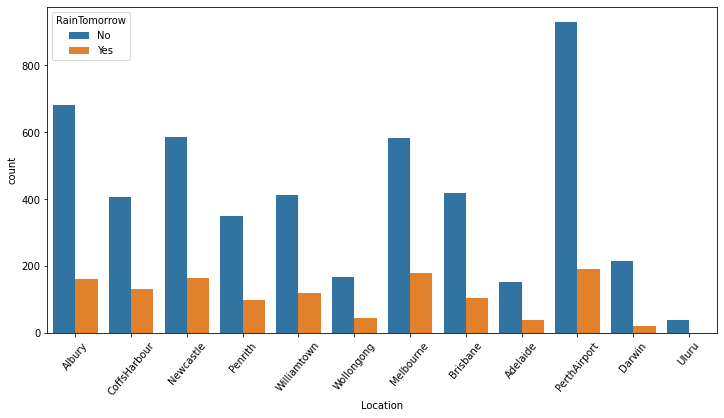

In [63]:
plt.subplots(figsize=(12,6))
sns.countplot(data_new["Location"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=50)
plt.show()

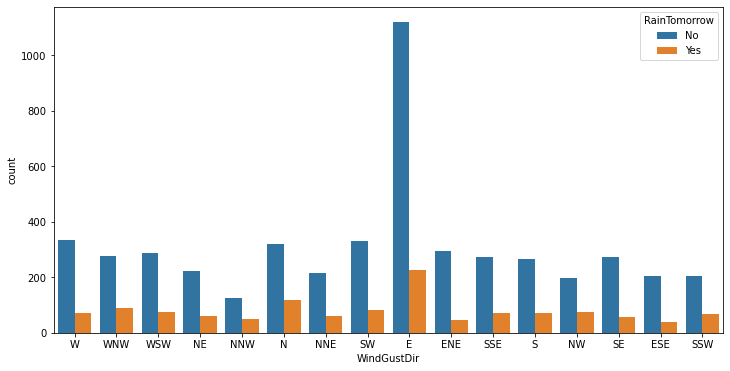

In [64]:
plt.subplots(figsize=(12,6))
sns.countplot(data_new["WindGustDir"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()


In [65]:
pd.crosstab(data['RainTomorrow'],data["Location"], margins= True)


Location,Adelaide,Albury,Brisbane,CoffsHarbour,Darwin,Melbourne,Newcastle,Penrith,PerthAirport,Uluru,Williamtown,Wollongong,All
RainTomorrow,,,,,,,,,,,,,
No,160,708,444,425,218,608,624,366,962,39,462,174,5190
Yes,45,199,135,186,32,203,198,116,242,0,153,63,1572
All,205,907,579,611,250,811,822,482,1204,39,615,237,6762


In [66]:
pd.crosstab(data['RainTomorrow'],data["WindGustDir"], margins= True)


WindGustDir,E,ENE,ESE,N,NE,NNE,NNW,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,All
RainTomorrow,,,,,,,,,,,,,,,,,
No,1183,302,212,326,230,218,129,205,278,288,296,218,351,348,290,316,5190
Yes,277,55,55,133,70,69,55,91,98,82,94,81,114,86,108,104,1572
All,1460,357,267,459,300,287,184,296,376,370,390,299,465,434,398,420,6762


Observation:Maximium WindGust direction is East(E).
Probability of raining tomorrow is high for Perth Airport.
There is no probability of Raining tomorrow in Uluru.


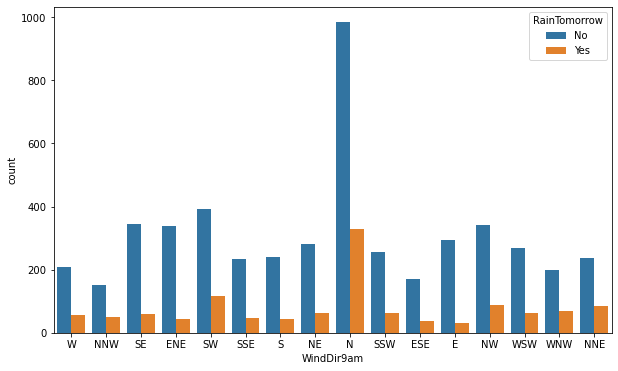

In [67]:
plt.subplots(figsize=(10,6))
sns.countplot(data_new["WindDir9am"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

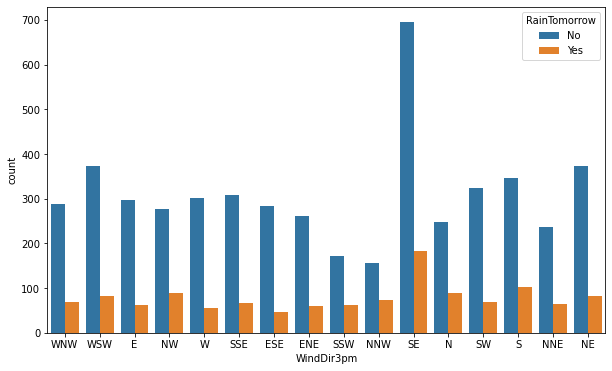

In [68]:
plt.subplots(figsize=(10,6))
sns.countplot(data_new["WindDir3pm"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

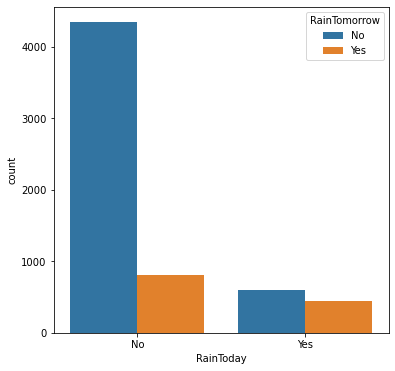

In [69]:
plt.subplots(figsize=(6,6))
sns.countplot(data_new["RainToday"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

In [70]:
pd.crosstab(data['RainTomorrow'],data["RainToday"], margins= True)


RainToday,No,Yes,All
RainTomorrow,,,
No,4374,816,5190
Yes,816,756,1572
All,5190,1572,6762


In [71]:
756/1572

0.48091603053435117

Observation: Maximum wind direction at 9am (WindDir9am) is North(N).
Maximum wind direction at 3pm (WindDir3pm) is South East(SE).


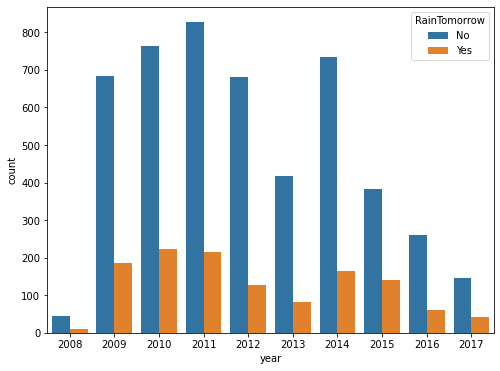

In [72]:
plt.subplots(figsize=(8,6))
sns.countplot(data_new["year"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

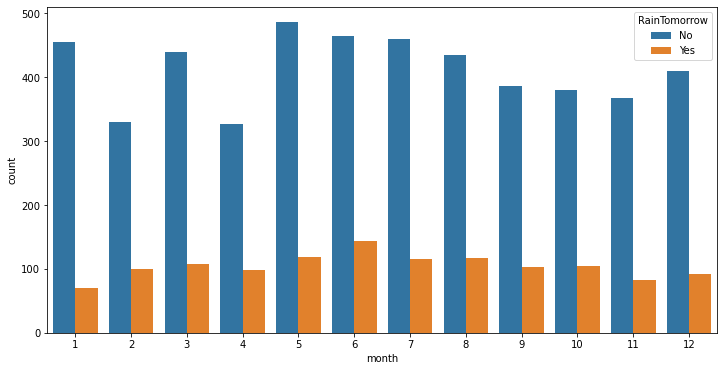

In [73]:
plt.subplots(figsize=(12,6))
sns.countplot(data_new["month"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

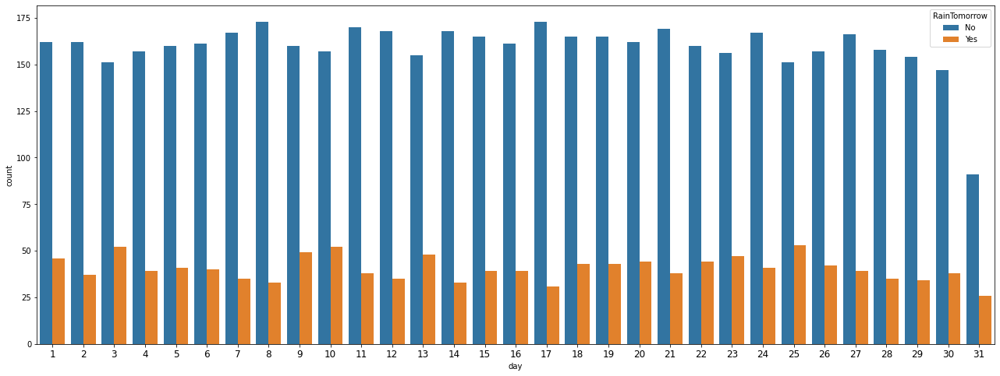

In [74]:
plt.subplots(figsize=(22,8))
sns.countplot(data_new["day"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0, fontsize=12)
plt.show()

Observation: There is no relation found between days, month and year with RainTomorrow.

# Checking Rainfall Vs Other Features

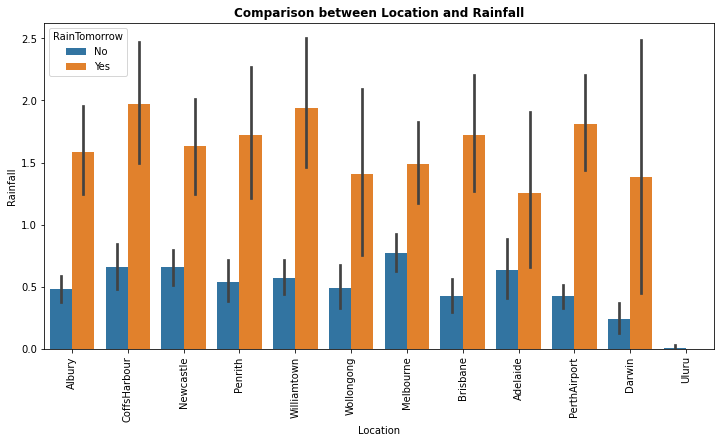

In [75]:
plt.figure(figsize=(12,6))
sns.barplot(x = "Location", y = "Rainfall",hue= 'RainTomorrow' , data = data_new)
plt.title('Comparison between Location and Rainfall', fontsize=12, fontweight='bold')
plt.xticks(rotation=90)
plt.show()


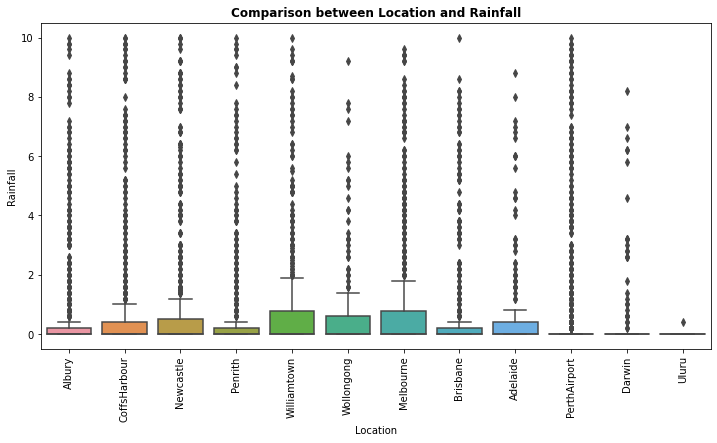

In [76]:
plt.figure(figsize=(12,6))
sns.boxplot(x = "Location", y = "Rainfall", data = data_new)
plt.title('Comparison between Location and Rainfall', fontsize=12, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

Observation: Rainfall is high if RainTomorrow is Yes.
Average Rainfall is high for Melbourne and Williamtown.

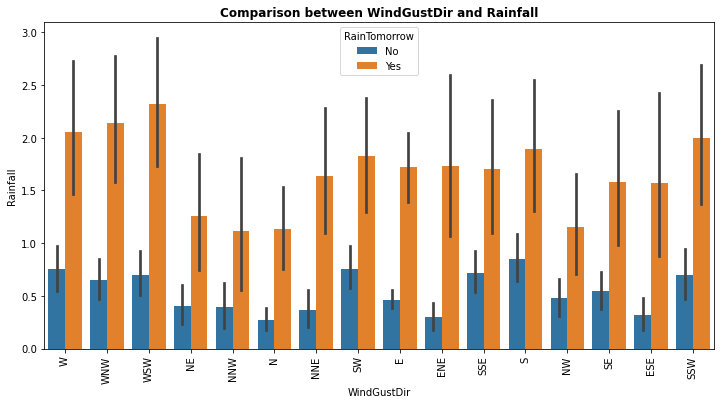

In [77]:
plt.figure(figsize=(12,6))
sns.barplot(x = "WindGustDir", y = "Rainfall", hue= 'RainTomorrow', data = data_new)
plt.title('Comparison between WindGustDir and Rainfall', fontsize=12, fontweight='bold')
plt.xticks(rotation=90)
plt.show()


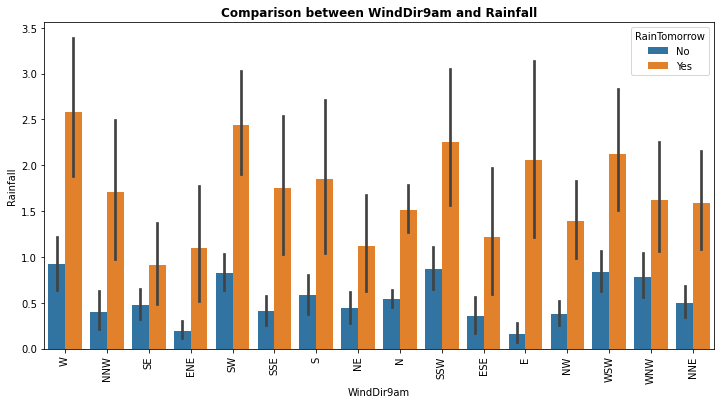

In [78]:
plt.figure(figsize=(12,6))
sns.barplot(x = "WindDir9am", y = "Rainfall",hue= 'RainTomorrow', data = data_new)
plt.title('Comparison between WindDir9am and Rainfall', fontsize=12, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

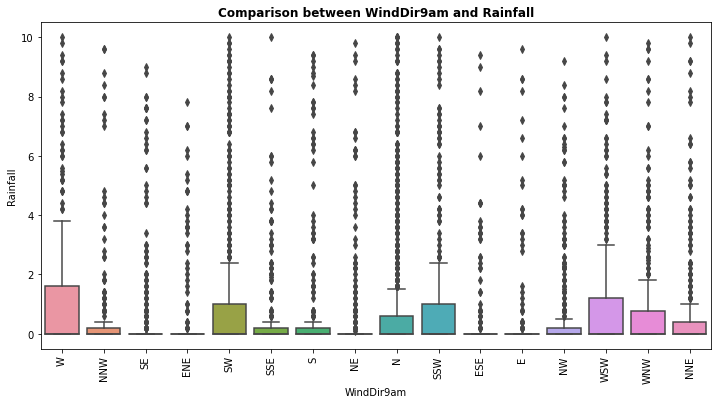

In [79]:
plt.figure(figsize=(12,6))
sns.boxplot(x = "WindDir9am", y = "Rainfall", data = data_new)
plt.title('Comparison between WindDir9am and Rainfall', fontsize=12, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

Observation:For WSW direction of wind gust, rain fall value is maximum.
For West direction of wind at 9am, rain fall value is maximum.

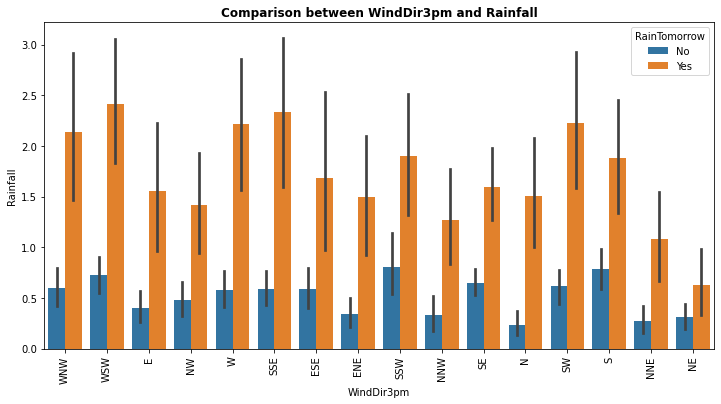

In [80]:
plt.figure(figsize=(12,6))
sns.barplot(x = "WindDir3pm", y = "Rainfall", hue= 'RainTomorrow',data = data_new)
plt.title('Comparison between WindDir3pm and Rainfall', fontsize=12, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

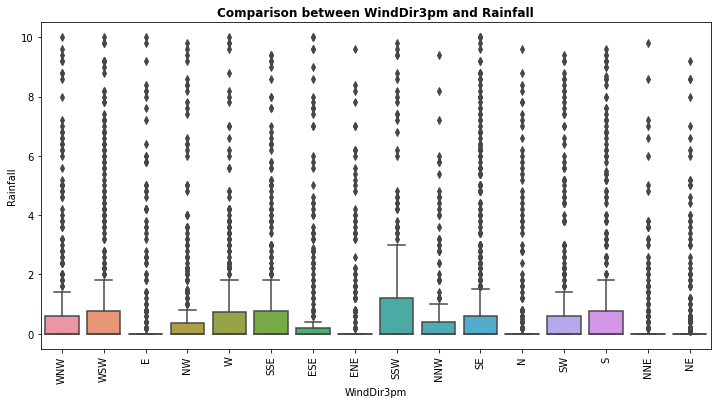

In [81]:
plt.figure(figsize=(12,6))
sns.boxplot(x = "WindDir3pm", y = "Rainfall", data = data_new)
plt.title('Comparison between WindDir3pm and Rainfall', fontsize=12, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

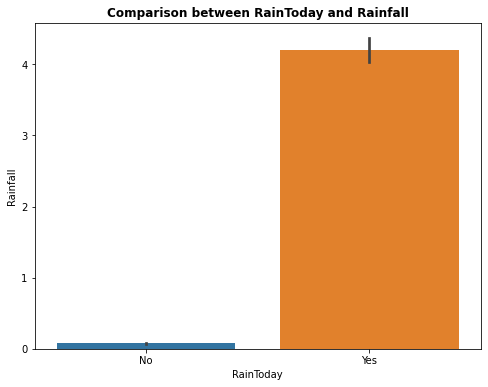

In [82]:
plt.figure(figsize=(8,6))
sns.barplot(x = "RainToday", y = "Rainfall", data = data_new)
plt.title('Comparison between RainToday and Rainfall', fontsize=12, fontweight='bold')
plt.show()

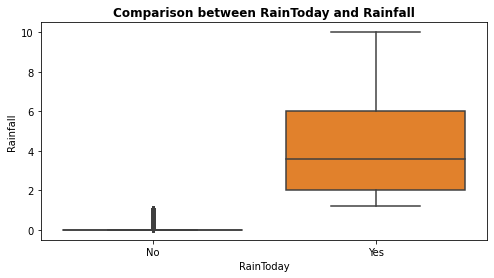

In [83]:
plt.figure(figsize=(8,4))
sns.boxplot(x = "RainToday", y = "Rainfall", data = data_new)
plt.title('Comparison between RainToday and Rainfall', fontsize=12, fontweight='bold')
plt.show()

Observation:Maximum avg direction of wind gust is SSW.
If direction of wind gust is WSW and SSE, rain fall value is maximum.


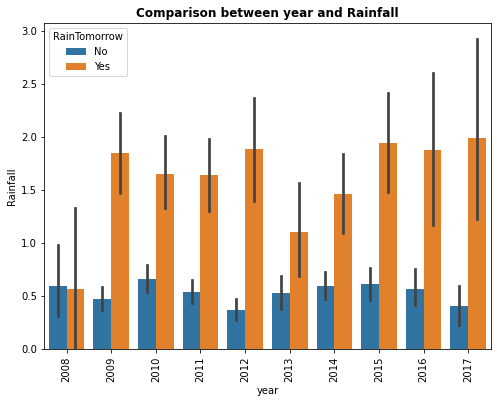

In [84]:
plt.figure(figsize=(8,6))
sns.barplot(x = "year", y = "Rainfall", hue= 'RainTomorrow', data = data_new)
plt.title('Comparison between year and Rainfall', fontsize=12, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

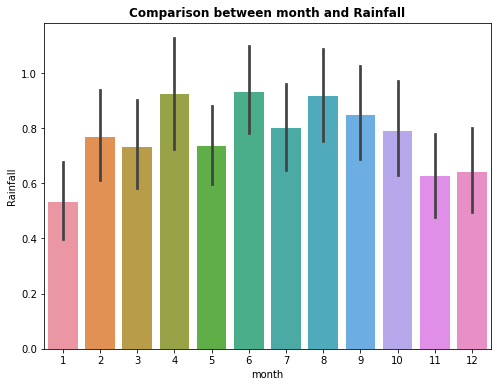

In [85]:
plt.figure(figsize=(8,6))
sns.barplot(x = "month", y = "Rainfall", data = data_new)
plt.title('Comparison between month and Rainfall', fontsize=12, fontweight='bold')
plt.xticks(rotation=0)
plt.show()


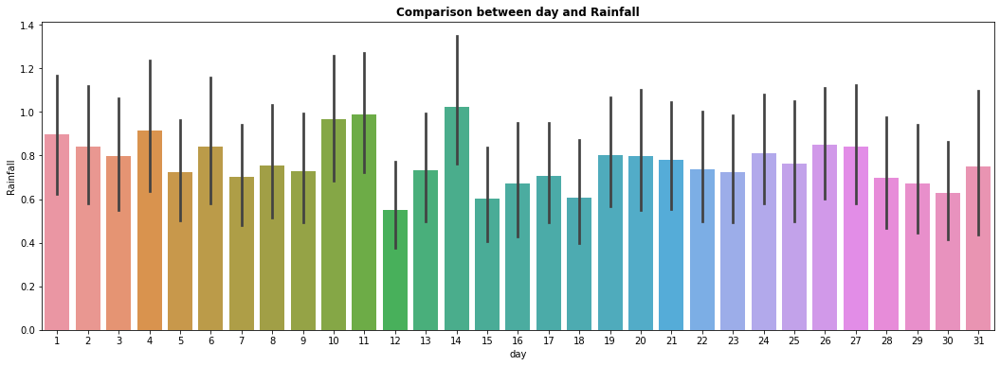

In [86]:
plt.figure(figsize=(18,6))
sns.barplot(x = "day", y = "Rainfall", data = data_new)
plt.title('Comparison between day and Rainfall', fontsize=12, fontweight='bold')
plt.xticks(rotation=0)
plt.show()

Observation: There is no relation between year, month, days with Rainfall.

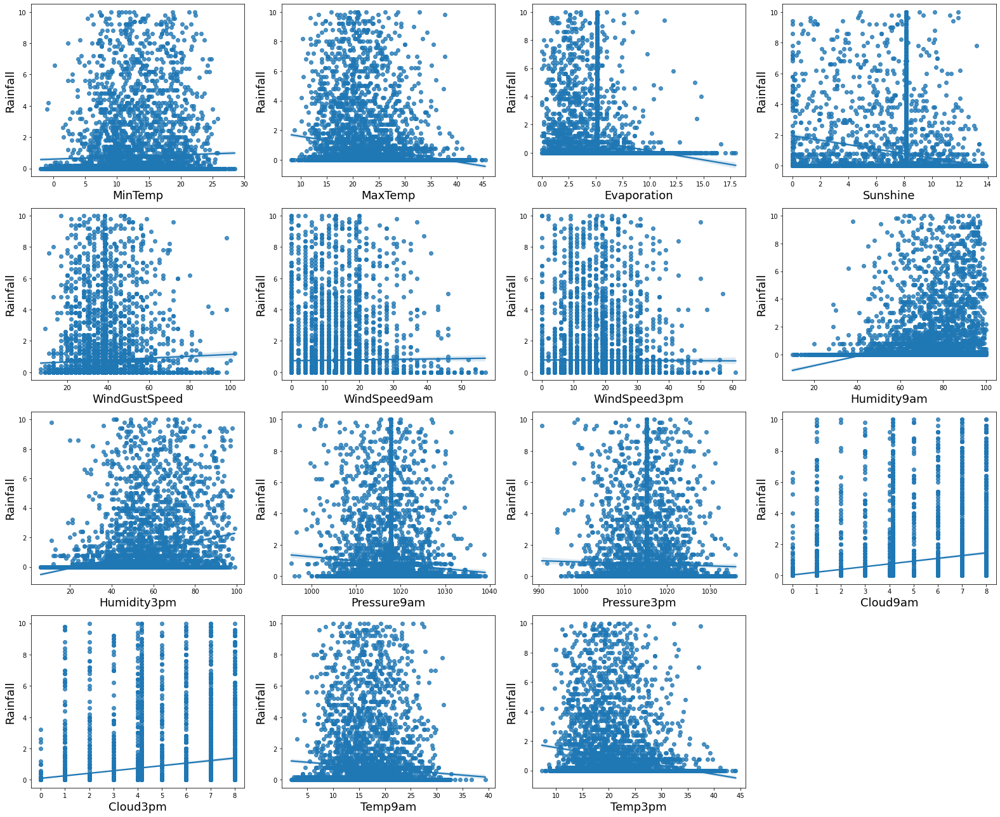

In [87]:
# linear regplot for numerical features with Rainfall

data_num = data_new[['MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 
                     'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
                     'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']]
i=0
plt.figure(figsize=(22,18))
for p in data_num.columns:
    plt.subplot(4,4,i+1)
    sns.regplot(x= p, y=data_new['Rainfall'], data=data_num)
    plt.xlabel(p,fontsize=18)
    plt.ylabel('Rainfall',fontsize=18)
    i+=1    
plt.tight_layout()


Observation: If temperature increased, rainfall is also increased.
There is a linear relationship between cloud and rainfall.
If humidity increased, Rainfall is also increased.


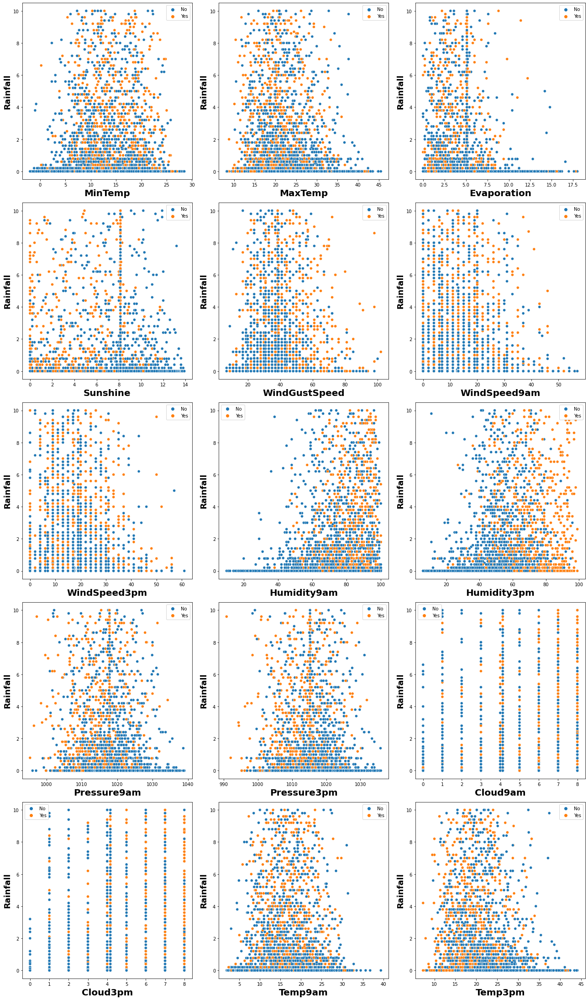

In [88]:
i=0
plt.figure(figsize=(18,36))
for p in data_num.columns:
    plt.subplot(6,3,i+1)
    sns.scatterplot(x=p, y='Rainfall',data= data_new, hue='RainTomorrow' ).legend(loc="best")
    plt.xlabel(p,fontsize=20,fontweight='bold')
    plt.ylabel('Rainfall',fontsize=18, fontweight='bold')
    i+=1   
plt.tight_layout()
plt.show()

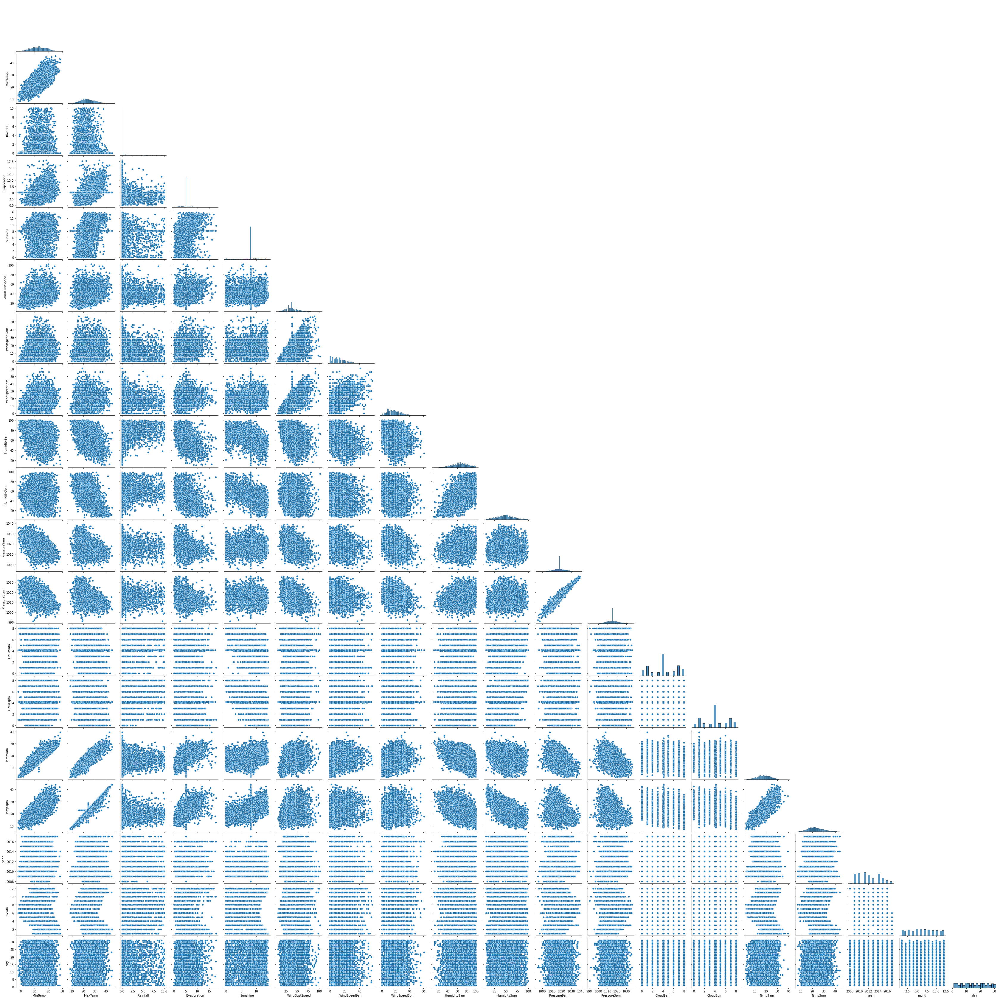

In [89]:
sns.pairplot(data_new, kind='scatter', corner=True)


Observation:
    If fraction of sky obscured by cloud is increased the probability of rainning will also increased.
    If sunshine more the chances of rain will be less.

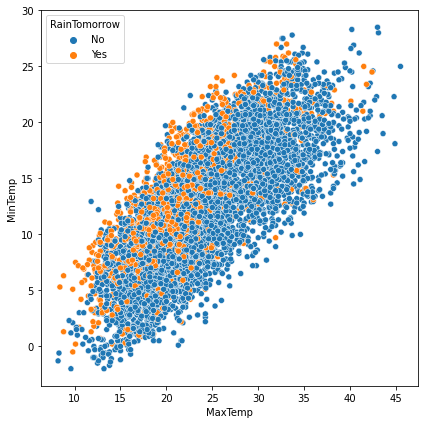

In [90]:
plt.figure(figsize=(6,6))
sns.scatterplot(x='MaxTemp', y='MinTemp',data= data_new, hue='RainTomorrow' )
plt.tight_layout()
plt.show()

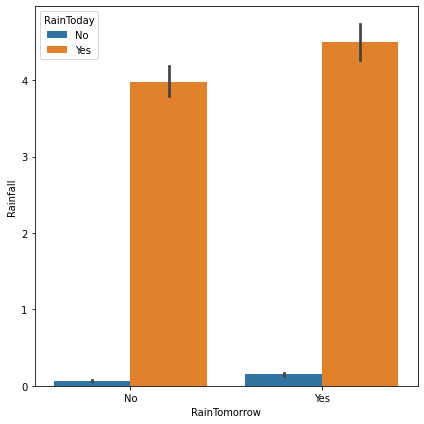

In [91]:
plt.figure(figsize=(6,6))
sns.barplot(y='Rainfall', x='RainTomorrow',data= data_new, hue='RainToday' )
plt.tight_layout()
plt.show()

Observation: If the rainfall amount increases the probability of rainning tomorrow will also be high.

<AxesSubplot:xlabel='Sunshine', ylabel='Rainfall'>

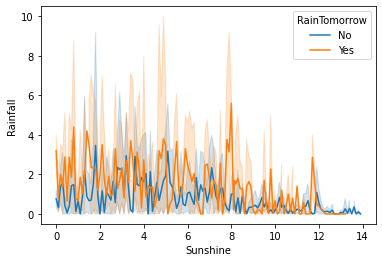

In [92]:
sns.lineplot(data=data_new, x='Sunshine',y='Rainfall',hue= 'RainTomorrow', color='green')


<AxesSubplot:xlabel='Sunshine', ylabel='Evaporation'>

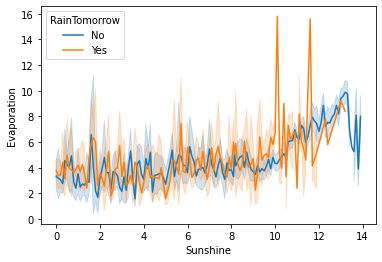

In [93]:
sns.lineplot(data=data_new, x='Sunshine',y='Evaporation', hue= 'RainTomorrow')


Observation: If sunshine increased the evaporation will also be increased and rainfall will decreased. 

# Encoding

Encoding Categorical data

In [94]:
# Using Label Encoder
cat=['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in cat:
    data_new[i] = le.fit_transform(data_new[i])
data_new.head()


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,1,13.4,22.9,0.6,5.11229,8.143039,13,44.0,13,14,...,1007.1,8.000000,4.164883,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,0.0,5.11229,8.143039,14,44.0,6,15,...,1007.8,4.130799,4.164883,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,0.0,5.11229,8.143039,15,46.0,13,15,...,1008.7,4.130799,2.000000,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,0.0,5.11229,8.143039,4,24.0,9,0,...,1012.8,4.130799,4.164883,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.0,5.11229,8.143039,13,41.0,1,7,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,2008,12,5


Observation: Now all categorical data has encoded.

# Correlation Matrix

In [95]:
data_new.corr()


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
Location,1.000000,0.100250,0.080632,0.002302,0.134742,0.056524,-0.089040,0.267961,-0.098123,-0.003672,...,-0.042807,-0.004300,-0.005083,0.107696,0.075844,-0.008783,-0.002677,0.501011,-0.071946,0.003197
MinTemp,0.100250,1.000000,0.741055,0.040954,0.391403,0.067218,-0.136507,0.263786,-0.019987,-0.132174,...,-0.458063,0.078963,0.030864,0.895394,0.709436,0.034233,0.075754,0.031078,-0.231714,0.020505
MaxTemp,0.080632,0.741055,1.000000,-0.189598,0.486379,0.364127,-0.191997,0.202769,-0.186338,-0.145656,...,-0.437712,-0.238150,-0.234404,0.868868,0.974603,-0.209070,-0.144266,0.079724,-0.173423,0.023737
Rainfall,0.002302,0.040954,-0.189598,1.000000,-0.159763,-0.208545,0.088653,0.042296,0.110365,0.082081,...,-0.026461,0.233549,0.200451,-0.085329,-0.194727,0.827864,0.247938,0.003657,0.005039,-0.017296
Evaporation,0.134742,0.391403,0.486379,-0.159763,1.000000,0.397755,-0.117932,0.243467,-0.127260,-0.019036,...,-0.314186,-0.130773,-0.166741,0.451956,0.472986,-0.170650,-0.102079,0.103643,-0.058832,0.013186
Sunshine,0.056524,0.067218,0.364127,-0.208545,0.397755,1.000000,-0.100710,0.033304,-0.077125,-0.055081,...,-0.077330,-0.528334,-0.553935,0.251112,0.383414,-0.211077,-0.318230,0.065206,-0.011679,0.002237
WindGustDir,-0.089040,-0.136507,-0.191997,0.088653,-0.117932,-0.100710,1.000000,-0.003280,0.368439,0.452680,...,-0.018671,0.117967,0.077582,-0.146291,-0.205601,0.101542,0.035998,-0.178586,0.028462,0.017704
WindGustSpeed,0.267961,0.263786,0.202769,0.042296,0.243467,0.033304,-0.003280,1.000000,-0.094370,0.057896,...,-0.361747,-0.012150,0.038674,0.252055,0.168776,0.043136,0.154622,-0.029067,0.048590,-0.005349
WindDir9am,-0.098123,-0.019987,-0.186338,0.110365,-0.127260,-0.077125,0.368439,-0.094370,1.000000,0.207692,...,0.051931,0.065252,0.054286,-0.060992,-0.195264,0.124943,0.023073,-0.064721,0.017523,-0.012212
WindDir3pm,-0.003672,-0.132174,-0.145656,0.082081,-0.019036,-0.055081,0.452680,0.057896,0.207692,1.000000,...,-0.044813,0.066902,0.051211,-0.131194,-0.159828,0.083994,-0.006565,0.011863,0.025747,0.004704


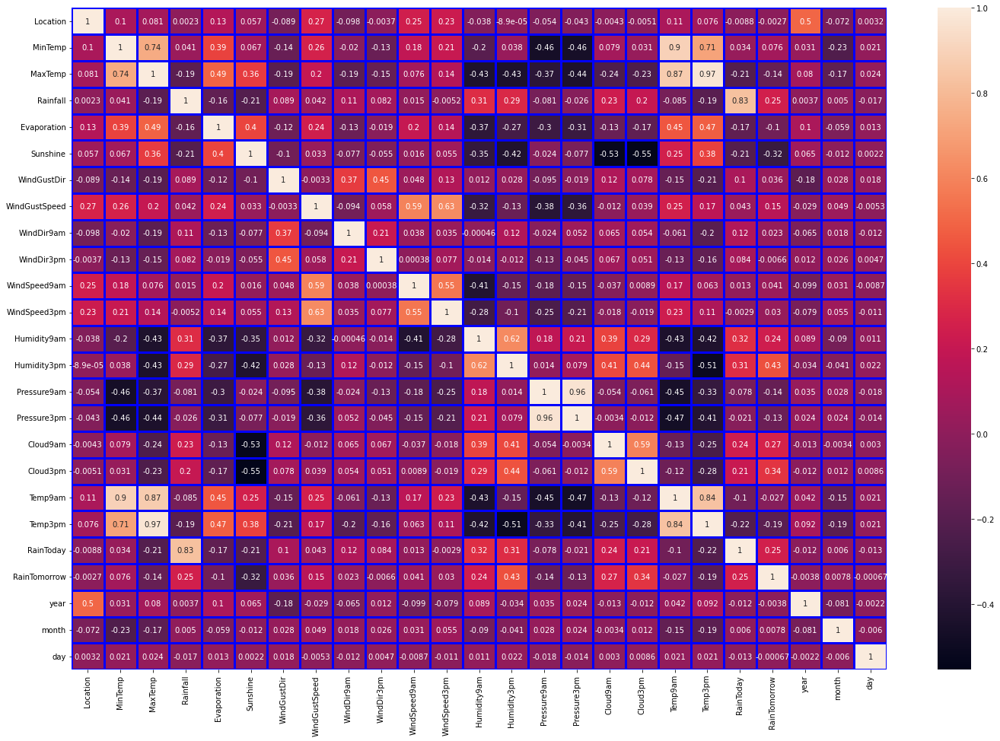

In [96]:
plt.subplots(figsize=(24,16))
sns.heatmap(data_new.corr(), annot= True, linecolor= "blue",  linewidths= 2.5)
plt.show()

In [97]:
data_new.columns


Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'year', 'month', 'day'],
      dtype='object')

Observation:

Temparature data (MinTemp,MaxTemp,Temp9am, Temp3pm) are highly correlated with each others.

Wind direction (WindDir9am, WindDir3pm),wind speed (WindGustSpeed, WindSpeed9am , WindSpeed3pm) are highly correlated with each others.

Humidity on 3pm is highly correlated with RainTomorrow.



In [98]:
data_new1= data_new.copy()
data_new2= data_new.copy()

# Correlation of RainTomorrow( Target -1) with Other Variables

<AxesSubplot:title={'center':'feature vs RainTomorrow corr'}>

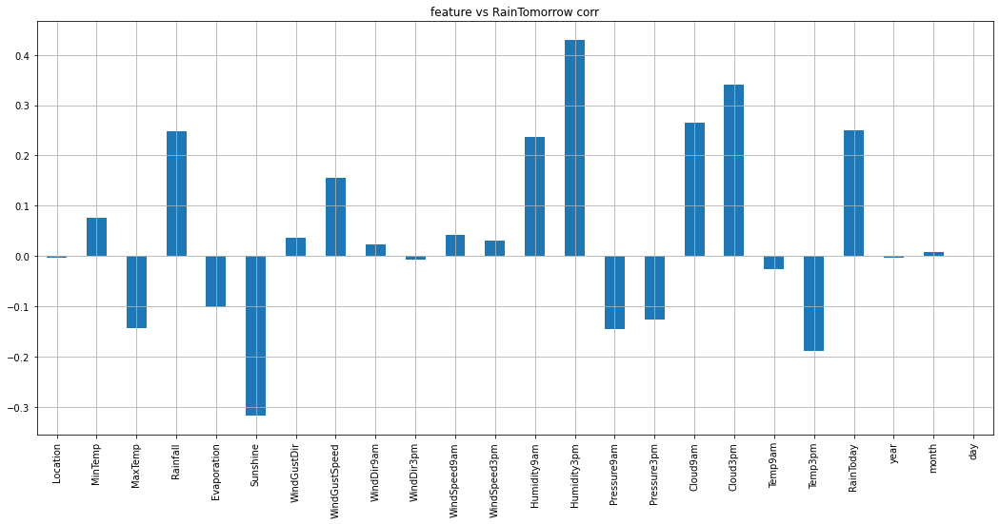

In [99]:
data_new1.drop("RainTomorrow", axis=1).corrwith(data_new1["RainTomorrow"]).plot(kind='bar',figsize=(18,8),grid='True',title='feature vs RainTomorrow corr')


Observation:
    Humidity,cloud,sunshine are highly correlated with RainTomorrow.
    Wind direction,location,day,month,year are less corelated with RainTomorrow

# Correlation of Rainfall( Target -2) with Other Variables

<AxesSubplot:title={'center':'feature vs Rainfall corr'}>

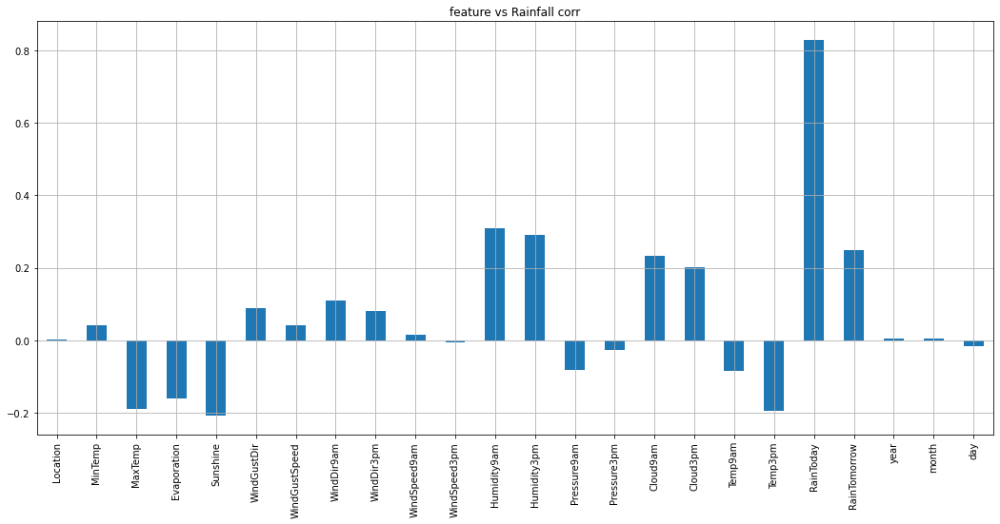

In [100]:
data_new2.drop("Rainfall", axis=1).corrwith(data_new2["Rainfall"]).plot(kind='bar',figsize=(18,8),grid='True',title='feature vs Rainfall corr')


Observation: Rainfall and raintoday are highly correlated with each other.
    Sunshine is negetively correlated with Rainfall.

# Checking Skewness

In [101]:
data_new.skew().sort_values()


Sunshine        -1.012057
Humidity9am     -0.223152
WindDir3pm      -0.096680
Cloud9am        -0.093878
Cloud3pm        -0.071504
Temp9am         -0.050254
MinTemp         -0.046847
Location        -0.006366
day              0.006650
month            0.011038
Pressure9am      0.081769
Pressure3pm      0.096755
WindGustDir      0.132835
Humidity3pm      0.154749
WindDir9am       0.262312
MaxTemp          0.305323
Temp3pm          0.330136
year             0.353322
WindSpeed3pm     0.507849
WindGustSpeed    0.776532
WindSpeed9am     0.961407
Evaporation      1.067808
RainTomorrow     1.480814
RainToday        1.775317
Rainfall         2.950935
dtype: float64

'WindDir3pm','RainTomorrow', 'RainToday' are skewed but it all are categorical data.
Numerical features have skewness.

In [102]:
df= data_new.copy()


In [103]:
df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 'WindGustSpeed', 
                     'WindSpeed9am', 'Evaporation', 'Rainfall']]


,Sunshine,Humidity9am,Cloud9am,Cloud3pm,WindGustSpeed,WindSpeed9am,Evaporation,Rainfall
0,8.143039,71.0,8.000000,4.164883,44.000000,20.0,5.11229,0.6
1,8.143039,44.0,4.130799,4.164883,44.000000,4.0,5.11229,0.0
2,8.143039,38.0,4.130799,2.000000,46.000000,19.0,5.11229,0.0
3,8.143039,45.0,4.130799,4.164883,24.000000,11.0,5.11229,0.0
4,8.143039,82.0,7.000000,8.000000,41.000000,7.0,5.11229,1.0
...,...,...,...,...,...,...,...,...
8420,8.143039,51.0,4.130799,4.164883,31.000000,13.0,5.11229,0.0
8421,8.143039,56.0,4.130799,4.164883,22.000000,13.0,5.11229,0.0
8422,8.143039,53.0,4.130799,4.164883,37.000000,9.0,5.11229,0.0
8423,8.143039,51.0,3.000000,2.000000,28.000000,13.0,5.11229,0.0


In [104]:
df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 'WindGustSpeed', 
                     'WindSpeed9am', 'Evaporation', 'Rainfall']].skew().sort_values()


Sunshine        -1.012057
Humidity9am     -0.223152
Cloud9am        -0.093878
Cloud3pm        -0.071504
WindGustSpeed    0.776532
WindSpeed9am     0.961407
Evaporation      1.067808
Rainfall         2.950935
dtype: float64

# Removing Skewness

In [105]:
from sklearn.preprocessing import PowerTransformer

scaler = PowerTransformer(method = 'yeo-johnson')
df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 'WindGustSpeed','WindSpeed9am',
    'Evaporation', 'Rainfall']] = scaler.fit_transform(df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 
                                'WindGustSpeed','WindSpeed9am', 'Evaporation', 'Rainfall']].values)
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,1,13.4,22.9,1.219177,0.096855,-0.111695,13,0.510244,13,14,...,1007.1,1.514840,0.030542,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,-0.626148,0.096855,-0.111695,14,0.510244,6,15,...,1007.8,0.039812,0.030542,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,-0.626148,0.096855,-0.111695,15,0.648740,13,15,...,1008.7,0.039812,-0.921266,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,-0.626148,0.096855,-0.111695,4,-1.162822,9,0,...,1012.8,0.039812,0.030542,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.550603,0.096855,-0.111695,13,0.294932,1,7,...,1006.0,1.144654,1.606329,17.8,29.7,0,0,2008,12,5


In [106]:
df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 'WindGustSpeed', 
                     'WindSpeed9am', 'Evaporation', 'Rainfall']].skew().sort_values()


Cloud9am        -0.213344
Cloud3pm        -0.175761
WindSpeed9am    -0.098294
Sunshine        -0.064093
Humidity9am     -0.059144
WindGustSpeed    0.014721
Evaporation      0.075057
Rainfall         1.115580
dtype: float64

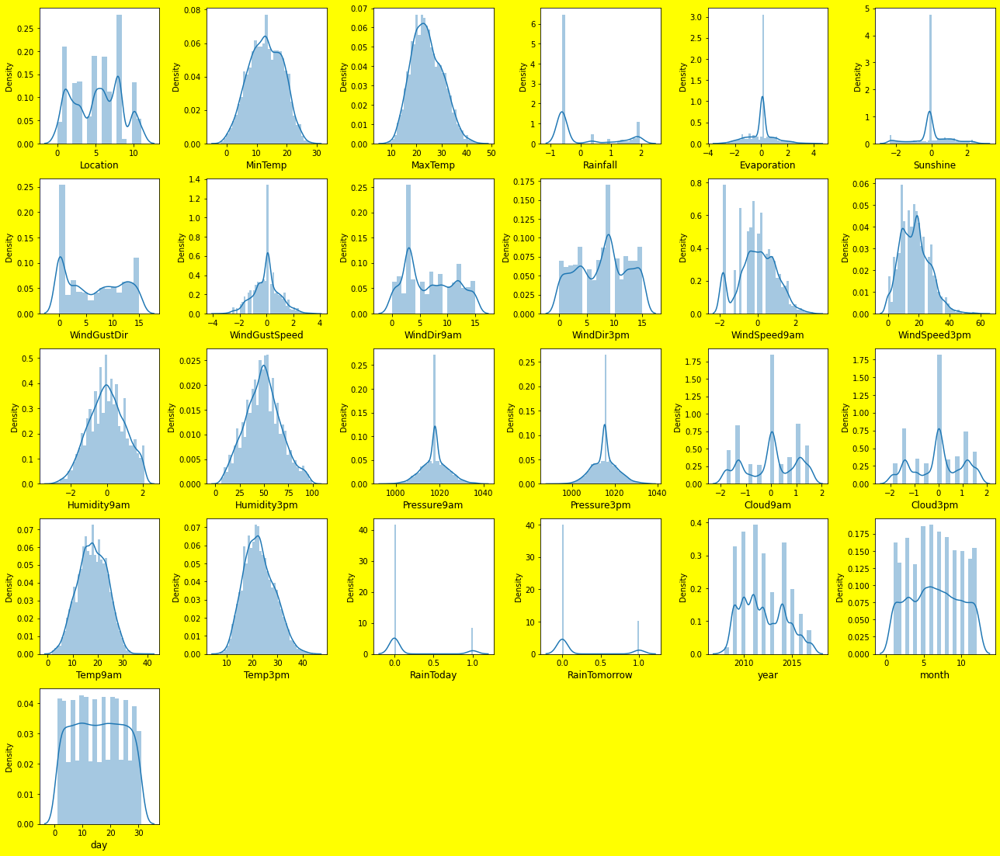

In [107]:
plt.figure(figsize=(18,18),facecolor='yellow')
plno=1
for x in df:
    if plno<=25:
        plt.subplot(6,6,plno)
        sns.distplot(df[x])
        plt.xlabel (x, fontsize=12)
    plno +=1
plt.tight_layout()

Observation: Now there is no skewness present.

# Checking Multicollinearity

In [108]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif= pd.DataFrame()
vif["VIF"]= [variance_inflation_factor(df.values,i)for i in range(df.shape[1])]
vif["Features"] = df.columns
vif

,VIF,Features
0,4.662270,Location
1,57.575868,MinTemp
2,435.269739,MaxTemp
3,3.866353,Rainfall
4,1.675385,Evaporation
5,2.176406,Sunshine
6,3.898123,WindGustDir
7,2.351482,WindGustSpeed
8,4.367772,WindDir9am
9,5.683163,WindDir3pm


Observation: Multicollinearity is present in data.

# PCA

Principal Component Analysis for RainTomorrow(Target- 1)

In [109]:
# Splitting data in target and features

x = df.drop(['RainTomorrow'], axis =1)
y = df['RainTomorrow']

In [110]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
pca = PCA()
scaler= StandardScaler()
x_scale = scaler.fit_transform(x)

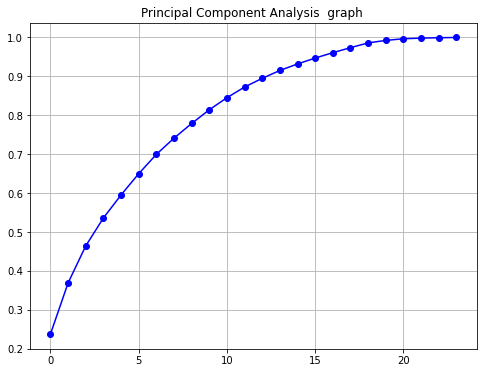

In [111]:
x_pca = pca.fit_transform(x_scale)
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'bo-')
plt.title('Principal Component Analysis  graph ')
plt.grid()


Observation: First 18 Components gives 100% variance.Considering 18 components.

In [112]:
pca_new = PCA(n_components=18)
x_scale_new = pca_new.fit_transform(x_scale)
prin_x=pd.DataFrame(x_scale_new )
prin_x.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.185696,2.058799,2.426091,-2.708043,-0.461850,0.226057,1.021020,-1.841043,0.906646,-0.176541,0.094152,-0.183305,0.607527,0.916737,1.275850,0.431561,-0.429944,-0.386843
1,0.776731,-0.073495,2.282371,-2.836269,-0.842932,-0.287382,1.905560,-1.721462,0.761154,-1.202865,-0.152154,0.466654,0.140669,0.250698,-0.197721,0.477076,0.407630,0.336084
2,1.672951,0.703057,3.315812,-3.061692,-0.587741,-0.077803,0.637753,-1.558628,0.672526,0.232163,-0.329854,0.427214,-0.107856,0.165339,0.737287,-0.191708,0.245054,0.191041
3,0.777712,-1.760886,0.055044,-1.878178,-1.823957,1.521855,0.583233,-1.517376,1.512926,0.520254,-0.866700,-1.309650,0.926117,-0.156615,0.281405,0.491985,0.068742,0.366839
4,0.885993,2.116557,-0.469062,-2.113850,-1.447582,0.889301,1.562778,-1.311374,1.186891,-1.562061,0.201854,0.739861,1.673946,0.269606,-0.551174,0.613048,-0.371297,-0.623882


# Using different Classification ML Models for Target-1 (RainTomorrow)

Balancing Target-1

In [113]:
# Using SMOTE 

from imblearn.over_sampling import SMOTE
ovrs = SMOTE()

In [114]:
y.value_counts()

0    4938
1    1254
Name: RainTomorrow, dtype: int64

In [115]:
x_scale_new,y = ovrs.fit_resample(x_scale_new,y)
y.value_counts()

0    4938
1    4938
Name: RainTomorrow, dtype: int64

Find Best Random State

In [116]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score

from sklearn.linear_model import LogisticRegression

acc_max=0
random_max=0
for i in range(0, 500):
    x_train,x_test,y_train,y_test = train_test_split(x_scale_new,y,test_size = 0.25, random_state=i)
    log= LogisticRegression()
    log.fit(x_train,y_train)
    y_pred=log.predict(x_test)
    acc= accuracy_score(y_test,y_pred)
    if acc>acc_max:
        acc_max=acc
        random_max=i
        
print('Best accuracy is', acc_max ,'on Random_state', random_max)


Best accuracy is 0.7881733495342244 on Random_state 36


Best accuracy is on Random State=388

In [117]:
print('Training feature shape:',x_train.shape)
print('Training target shape:',y_train.shape)
print('Test feature shape:',x_test.shape)
print('Test target shape:',y_test.shape)

Training feature shape: (7407, 18)
Training target shape: (7407,)
Test feature shape: (2469, 18)
Test target shape: (2469,)


# Logistic Regression

In [118]:
from sklearn.linear_model import LogisticRegression

x_train,x_test,y_train,y_test = train_test_split(x_scale_new,y,test_size = 0.25, random_state=483)

log = LogisticRegression()

log.fit(x_train, y_train)

y_pred = log.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print ('cof_mat:\n ', confusion_matrix(y_test, y_pred))
print('classification report:\n ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', log.score(x_train, y_train))
print('testing score : ', log.score(x_test, y_test))

accu score :  0.7825030376670717
cof_mat:
  [[982 262]
 [275 950]]
classification report:
                precision    recall  f1-score   support

           0       0.78      0.79      0.79      1244
           1       0.78      0.78      0.78      1225

    accuracy                           0.78      2469
   macro avg       0.78      0.78      0.78      2469
weighted avg       0.78      0.78      0.78      2469

-----------
-----------
training score :  0.7654921020656136
testing score :  0.7825030376670717


Hyperparameter tuning

In [119]:
# Using GridsearchCV

from sklearn.model_selection import GridSearchCV
grid = dict(solver=['newton-cg', 'lbfgs', 'liblinear', 'sag'],penalty=['l2','l1','elasticnet', 'none'], C=[1.0, 0.1,0.01,0.001]
           , max_iter=[100, 140, 80])

grid_log = GridSearchCV(estimator=log, param_grid= grid, cv=5 )

grid_log.fit(x_train, y_train)
print('best params : ', grid_log.best_params_)

best params :  {'C': 0.01, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}


In [120]:
grid_log_best = grid_log.best_estimator_
grid_log_best.fit(x_train, y_train)

y_pred = grid_log_best.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print ('cof_mat:\n\n ', confusion_matrix(y_test, y_pred))
print('classification report:\n ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', grid_log_best.score(x_train, y_train))
print('testing score : ', grid_log_best.score(x_test, y_test))


accu score :  0.7816929931146213
cof_mat:

  [[976 268]
 [271 954]]
classification report:
                precision    recall  f1-score   support

           0       0.78      0.78      0.78      1244
           1       0.78      0.78      0.78      1225

    accuracy                           0.78      2469
   macro avg       0.78      0.78      0.78      2469
weighted avg       0.78      0.78      0.78      2469

-----------
-----------
training score :  0.7677872282975564
testing score :  0.7816929931146213


Observation:
Accuracy score not improved after using gridsearchCV.

# ExtraTrees Classifier

In [121]:
from sklearn.ensemble import ExtraTreesClassifier

etc =ExtraTreesClassifier()
etc.fit(x_train, y_train)

y_pred = etc.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', etc.score(x_train, y_train))
print('testing score : ', etc.score(x_test, y_test))

accu score :  0.9246658566221142


cof_mat:  [[1130  114]
 [  72 1153]]


classification report:                precision    recall  f1-score   support

           0       0.94      0.91      0.92      1244
           1       0.91      0.94      0.93      1225

    accuracy                           0.92      2469
   macro avg       0.93      0.92      0.92      2469
weighted avg       0.93      0.92      0.92      2469

-----------
-----------
training score :  1.0
testing score :  0.9246658566221142


Hyperparameter tuning

In [122]:
# Using GridsearchCV
params = {'n_estimators' : [100,80, 150], 'min_samples_leaf': [1,2],
          'criterion' : ["gini", "entropy"]}

etc_grd = GridSearchCV(etc, param_grid = params, cv=5)

etc_grd.fit(x_train, y_train)
print('best params : ', etc_grd.best_params_)

best params :  {'criterion': 'gini', 'min_samples_leaf': 1, 'n_estimators': 100}


In [123]:
grid_etc_best = etc_grd.best_estimator_
grid_etc_best.fit(x_train, y_train)

y_pred = grid_etc_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_etc_best.score(x_train, y_train))
print('testing score : ', grid_etc_best.score(x_test, y_test))


accu score :  0.924260834345889


cof_mat:  [[1124  120]
 [  67 1158]]


classification report: 
               precision    recall  f1-score   support

           0       0.94      0.90      0.92      1244
           1       0.91      0.95      0.93      1225

    accuracy                           0.92      2469
   macro avg       0.92      0.92      0.92      2469
weighted avg       0.93      0.92      0.92      2469

-----------
-----------
training score :  1.0
testing score :  0.924260834345889


Observation: Accuracy score improves slightly after using gridsearchCV.

# DecisionTree Classifier

In [124]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier()
clf.fit(x_train, y_train)

y_pred = clf.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n\n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', clf.score(x_train, y_train))
print('testing score : ', clf.score(x_test, y_test))

accu score :  0.8011340623734305


cof_mat:  [[ 961  283]
 [ 208 1017]]


classification report: 

               precision    recall  f1-score   support

           0       0.82      0.77      0.80      1244
           1       0.78      0.83      0.81      1225

    accuracy                           0.80      2469
   macro avg       0.80      0.80      0.80      2469
weighted avg       0.80      0.80      0.80      2469

-----------
-----------
training score :  1.0
testing score :  0.8011340623734305


Hyperparameter tuning

In [125]:
# Using GridsearchCV

param = {'criterion' : ['gini', 'entropy', 'log_loss'],
    'min_samples_split' : range(1,4), 'splitter': ["best", "random"], 'ccp_alpha': [0.1, .01, .001, 10,1],
        'max_features': ['auto', 'sqrt', 'log2']}

grid_search = GridSearchCV(estimator = clf, cv=5, param_grid = param)

grid_search.fit(x_train, y_train)
print('best params : ', grid_search.best_params_)

best params :  {'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_features': 'auto', 'min_samples_split': 2, 'splitter': 'best'}


In [126]:
grid_clf_best = grid_search.best_estimator_
grid_clf_best.fit(x_train, y_train)

y_pred = grid_clf_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n\n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_clf_best.score(x_train, y_train))
print('testing score : ', grid_clf_best.score(x_test, y_test))


accu score :  0.7626569461320373


cof_mat:  [[933 311]
 [275 950]]


classification report: 

               precision    recall  f1-score   support

           0       0.77      0.75      0.76      1244
           1       0.75      0.78      0.76      1225

    accuracy                           0.76      2469
   macro avg       0.76      0.76      0.76      2469
weighted avg       0.76      0.76      0.76      2469

-----------
-----------
training score :  0.8601323072769003
testing score :  0.7626569461320373


Observation: Accuracy score not improved after using gridsearchCV.

# Random Forest Classifier

In [127]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(x_train, y_train)

y_pred = rf.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', rf.score(x_train, y_train))
print('testing score : ', rf.score(x_test, y_test))

accu score :  0.8991494532199271


cof_mat:  [[1086  158]
 [  91 1134]]


classification report:                precision    recall  f1-score   support

           0       0.92      0.87      0.90      1244
           1       0.88      0.93      0.90      1225

    accuracy                           0.90      2469
   macro avg       0.90      0.90      0.90      2469
weighted avg       0.90      0.90      0.90      2469

-----------
-----------
training score :  1.0
testing score :  0.8991494532199271


Hyperparameter tuning

In [128]:
# Using GridsearchCV

params = {'n_estimators' : [100,80, 150], 'min_samples_leaf': [1,2,3],
          'criterion' : ["gini", "entropy"]}

rf_grd = GridSearchCV(rf, param_grid = params, cv=5)

rf_grd.fit(x_train, y_train)
print('best params : ', rf_grd.best_params_)

best params :  {'criterion': 'entropy', 'min_samples_leaf': 1, 'n_estimators': 150}


In [129]:
grid_rf_best = rf_grd.best_estimator_

grid_rf_best.fit(x_train, y_train)

y_pred = grid_rf_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_rf_best.score(x_train, y_train))
print('testing score : ', grid_rf_best.score(x_test, y_test))

accu score :  0.9015795868772782


cof_mat:  [[1086  158]
 [  85 1140]]


classification report: 
               precision    recall  f1-score   support

           0       0.93      0.87      0.90      1244
           1       0.88      0.93      0.90      1225

    accuracy                           0.90      2469
   macro avg       0.90      0.90      0.90      2469
weighted avg       0.90      0.90      0.90      2469

-----------
-----------
training score :  1.0
testing score :  0.9015795868772782


Observation: Accuracy score improved after using gridsearchCV.

# Gradient Boosting Classifier

In [130]:
from sklearn.ensemble import GradientBoostingClassifier

gbdt= GradientBoostingClassifier()
gbdt.fit(x_train, y_train)

y_pred = gbdt.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n\n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', gbdt.score(x_train, y_train))
print('testing score : ', gbdt.score(x_test, y_test))

accu score :  0.823005265289591


cof_mat:  [[1020  224]
 [ 213 1012]]


classification report: 

               precision    recall  f1-score   support

           0       0.83      0.82      0.82      1244
           1       0.82      0.83      0.82      1225

    accuracy                           0.82      2469
   macro avg       0.82      0.82      0.82      2469
weighted avg       0.82      0.82      0.82      2469

-----------
-----------
training score :  0.8408262454434994
testing score :  0.823005265289591


Hyperparameter tuning

In [131]:
# Using GridsearchCV

param= {"min_samples_split" : [2,3],"learning_rate": [0.1,0.01,1.0], 
        "min_samples_leaf" :[1,2], "criterion":['friedman_mse', 'squared_error'] }

grid_gbdt= GridSearchCV (gbdt, param_grid= param,cv=5)

grid_gbdt.fit(x_train, y_train)
print('best params : ', grid_gbdt.best_params_)

best params :  {'criterion': 'friedman_mse', 'learning_rate': 1.0, 'min_samples_leaf': 1, 'min_samples_split': 2}


In [132]:
grid_gbdt_best = grid_gbdt.best_estimator_
grid_gbdt_best.fit(x_train, y_train)

y_pred = grid_gbdt_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report:\n\n ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_gbdt_best.score(x_train, y_train))
print('testing score : ', grid_gbdt_best.score(x_test, y_test))


accu score :  0.8424463345484001


cof_mat:  [[1025  219]
 [ 170 1055]]


classification report:

                precision    recall  f1-score   support

           0       0.86      0.82      0.84      1244
           1       0.83      0.86      0.84      1225

    accuracy                           0.84      2469
   macro avg       0.84      0.84      0.84      2469
weighted avg       0.84      0.84      0.84      2469

-----------
-----------
training score :  0.9577426758471715
testing score :  0.8424463345484001


Observation: Accuracy score,training score,testing score improved after using gridsearchCV.

# SVC('rbf')

In [133]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA

def svmkernel(ker):
    #svc = SVC(kernel = ker )
    pipe = Pipeline([('PCA', PCA()),
                ('SVM', SVC(C=7, gamma=0.01, kernel = ker))])
    
    pipe.fit(x_train, y_train)
    pipe.score(x_train, y_train)
    predsvc = pipe.predict(x_test)
    print('accu score : ', accuracy_score(y_test, predsvc))
    print("\n")
    print ('cof_mat: ', confusion_matrix(y_test, predsvc))
    print("\n")
    print('classification report: \n\n', classification_report(y_test, predsvc))
    
    print("-----------")
    print("-----------")
    
    
    print('training score : ', pipe.score(x_train, y_train))
    print('testing score : ', pipe.score(x_test, y_test))

In [134]:
svmkernel('rbf')

accu score :  0.8363710004050223


cof_mat:  [[1007  237]
 [ 167 1058]]


classification report: 

               precision    recall  f1-score   support

           0       0.86      0.81      0.83      1244
           1       0.82      0.86      0.84      1225

    accuracy                           0.84      2469
   macro avg       0.84      0.84      0.84      2469
weighted avg       0.84      0.84      0.84      2469

-----------
-----------
training score :  0.8358309707033886
testing score :  0.8363710004050223


# SVC ('linear')

In [135]:
svmkernel('linear')

accu score :  0.7796678817334953


cof_mat:  [[976 268]
 [276 949]]


classification report: 

               precision    recall  f1-score   support

           0       0.78      0.78      0.78      1244
           1       0.78      0.77      0.78      1225

    accuracy                           0.78      2469
   macro avg       0.78      0.78      0.78      2469
weighted avg       0.78      0.78      0.78      2469

-----------
-----------
training score :  0.7700823545294991
testing score :  0.7796678817334953


# SVC ('poly')

In [136]:
svmkernel('poly')

accu score :  0.7954637505062778


cof_mat:  [[1014  230]
 [ 275  950]]


classification report: 

               precision    recall  f1-score   support

           0       0.79      0.82      0.80      1244
           1       0.81      0.78      0.79      1225

    accuracy                           0.80      2469
   macro avg       0.80      0.80      0.80      2469
weighted avg       0.80      0.80      0.80      2469

-----------
-----------
training score :  0.796543809909545
testing score :  0.7954637505062778


Observation: SVC('rbf') is better than other.

# Cross Validation

In [137]:
from sklearn.model_selection import cross_val_score
svm_best = Pipeline([('PCA', PCA()),
                ('SVM', SVC(C=7, gamma=0.01, kernel = "rbf"))])

all_models = [grid_log_best, clf, grid_gbdt_best, grid_rf_best, grid_etc_best, svm_best ]

for i in all_models:
    cvscore = cross_val_score(i, x_scale_new,y, cv =7)
    print('Cross Validation Score of :',i)
    print("\n Cross Validation Score : " ,cvscore)
    print("\nMean CV Score :",cvscore.mean())
    print("\nStd deviation :",cvscore.std())
    print("\n-----------")
    print("-----------")

Cross Validation Score of : LogisticRegression(C=0.01, solver='liblinear')

 Cross Validation Score :  [0.7406095  0.69454288 0.71934798 0.63217576 0.70163005 0.79659816
 0.81631206]

Mean CV Score : 0.7287451971303774

Std deviation : 0.05822583389655628

-----------
-----------
Cross Validation Score of : DecisionTreeClassifier()

 Cross Validation Score :  [0.74698795 0.71367824 0.74131821 0.72714387 0.76683203 0.80510276
 0.81914894]

Mean CV Score : 0.7600302874289937

Std deviation : 0.036494773200896634

-----------
-----------
Cross Validation Score of : GradientBoostingClassifier(learning_rate=1.0)

 Cross Validation Score :  [0.66973777 0.6789511  0.71296953 0.69454288 0.76683203 0.82211198
 0.82978723]

Mean CV Score : 0.7392760744390039

Std deviation : 0.062084227398524566

-----------
-----------
Cross Validation Score of : RandomForestClassifier(criterion='entropy', n_estimators=150)

 Cross Validation Score :  [0.81927711 0.79872431 0.78313253 0.74415308 0.8355776  0.92

# Observation:
    
    Extratreesclassifier has best accuracy score ,it is best fit model for this dataset.

# Ploting AUC/ROC Curve

In [138]:

grid_log_best.fit(x_train, y_train)
clf.fit(x_train, y_train)
grid_gbdt_best.fit(x_train, y_train)
grid_rf_best.fit(x_train, y_train)
grid_etc_best.fit(x_train, y_train)
svm_best.fit(x_train, y_train)
print ("All model are trained")

All model are trained


In [139]:
grid_log_best.fit(x_test, y_test)
clf.fit(x_test, y_test)
grid_gbdt_best.fit(x_test, y_test)
grid_rf_best.fit(x_test, y_test)
grid_etc_best.fit(x_test, y_test)
svm_best.fit(x_test, y_test)
print ("All model are tested")

All model are tested


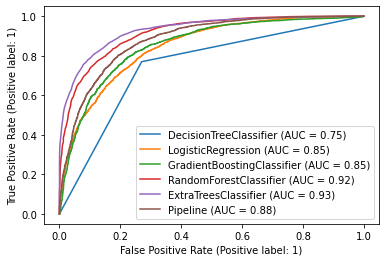

In [140]:
from sklearn.metrics import plot_roc_curve

disp = plot_roc_curve(clf, x_train, y_train)

plot_roc_curve(grid_log_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(grid_gbdt_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(grid_rf_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(grid_etc_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(svm_best, x_train, y_train, ax=disp.ax_)

plt.legend(prop = {'size':10}, loc='lower right')
plt.show()

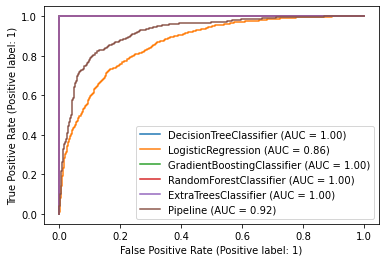

In [141]:
from sklearn.metrics import plot_roc_curve

disp = plot_roc_curve(clf, x_test, y_test)

plot_roc_curve(grid_log_best, x_test, y_test, ax=disp.ax_)
plot_roc_curve(grid_gbdt_best, x_test, y_test, ax=disp.ax_)
plot_roc_curve(grid_rf_best,x_test, y_test, ax=disp.ax_)
plot_roc_curve(grid_etc_best, x_test, y_test, ax=disp.ax_)
plot_roc_curve(svm_best,x_test, y_test, ax=disp.ax_)

plt.legend(prop = {'size':10}, loc='lower right')
plt.show()

Observation: ExtraTreesClassifier has best AUC score for training and testing.It is best fit model for dataset.

In [142]:
grid_etc_best.fit(x_train, y_train)
y_pred = grid_etc_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_etc_best.score(x_train, y_train))
print('testing score : ', grid_etc_best.score(x_test, y_test))

accu score :  0.9181855002025111


cof_mat:  [[1116  128]
 [  74 1151]]


classification report: 
               precision    recall  f1-score   support

           0       0.94      0.90      0.92      1244
           1       0.90      0.94      0.92      1225

    accuracy                           0.92      2469
   macro avg       0.92      0.92      0.92      2469
weighted avg       0.92      0.92      0.92      2469

-----------
-----------
training score :  1.0
testing score :  0.9181855002025111


# Confusion Matrix

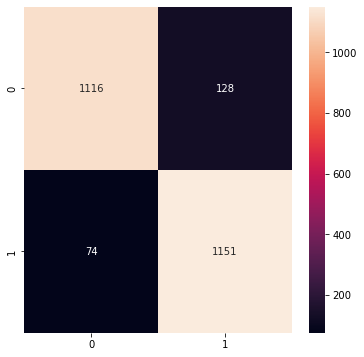

In [143]:
conf = confusion_matrix (y_test, y_pred)

fig , ax = plt.subplots(figsize=(6,6))
sns.heatmap(conf, annot = True, fmt = ".0f")
plt.show()

# Saving Model

In [144]:
import pickle
pickle.dump(grid_etc_best, open("Raining_Tomorrow_Classification_model", "wb"))
load_Raining_Tomorrow_Classification_model= pickle.load(open("Raining_Tomorrow_Classification_model", "rb"))


In [145]:
y_pred = load_Raining_Tomorrow_Classification_model.predict(x_test)

y_test = np.array(y_test)
data_prediction_by_model = pd.DataFrame()
data_prediction_by_model["Predicted Values"] = y_pred
data_prediction_by_model["Actual Values"] = y_test
data_prediction_by_model.sample(n=5)

,Predicted Values,Actual Values
735,1,1
949,0,0
104,0,0
534,0,0
1337,0,0


# For Target-2 (Rainfall)

# PCA (Rainfall)

In [146]:
# Principal Component Analysis(Target-2)

# Splitting data in target and features
x = df.drop(['Rainfall'], axis =1)
y = df['Rainfall']

In [147]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
pca = PCA()
scaler= StandardScaler()
x_scale = scaler.fit_transform(x)

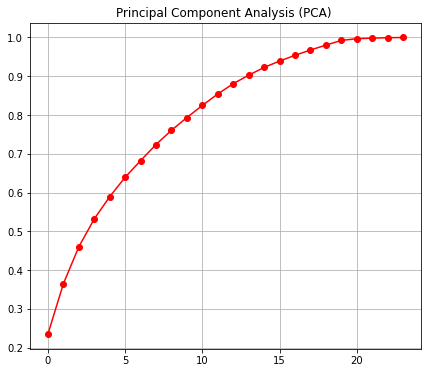

In [148]:
x_pca = pca.fit_transform(x_scale)
plt.figure(figsize=(7,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.title('Principal Component Analysis (PCA) ')
plt.grid()

Observation: First 18 component gives 100% variance.

In [149]:
pca_new = PCA(n_components=18)
x_scale_new = pca_new.fit_transform(x_scale)
prin_x=pd.DataFrame(x_scale_new )
prin_x.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.438399,1.481065,2.568651,-2.760534,-0.518045,0.848781,-0.880574,-2.048714,0.382391,0.098396,-0.285396,-0.936250,-0.377667,0.132550,0.715525,-1.107523,-0.564721,-0.589158
1,0.723134,-0.041671,2.284611,-2.795278,-0.598141,1.805511,-1.197102,-1.951004,-0.205048,0.819666,-0.065682,0.365748,-0.360321,0.077820,0.251895,0.269751,-0.463495,0.396416
2,1.645901,0.658135,3.342280,-3.033464,-0.471122,0.593203,-0.343698,-1.637346,0.574524,-0.061865,-0.344585,0.108539,-0.458690,-0.242831,0.053024,-0.720944,0.063462,0.250801
3,0.689079,-1.699633,0.017446,-1.793467,-2.510215,0.429092,-0.703834,-1.689618,1.291667,-0.434946,-0.933064,-0.375738,1.051904,0.912332,-0.083279,-0.188224,-0.516531,0.039352
4,1.183925,1.497921,-0.330668,-2.175211,-1.664565,1.252765,-1.728037,-1.680988,-0.162646,1.255682,-0.154612,-0.514156,-1.147017,1.363865,0.356928,0.659869,-0.455814,-0.448976


# Using different Regression ML Models (Target-2)

Find Best Random State

In [150]:
from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

r2_max=0
random_max=0
for i in range(1000,3000):
    x_train,x_test,y_train,y_test = train_test_split(x_scale_new,y,test_size = 0.25, random_state=i)
    lin_reg= LinearRegression()
    
    lin_reg.fit(x_train,y_train)
    y_pred=lin_reg.predict(x_test)
    r2 = r2_score(y_test,y_pred)
    
    if r2>r2_max:
        r2_max=r2
        random_max=i
print('Best accuracy is', r2_max ,'on Random_state', random_max)


Best accuracy is 0.7815011677141492 on Random_state 1984


In [151]:
print('Training feature shape:',x_train.shape)
print('Training target shape:',y_train.shape)
print('Test feature shape:',x_test.shape)
print('Test target shape:',y_test.shape)

Training feature shape: (4644, 18)
Training target shape: (4644,)
Test feature shape: (1548, 18)
Test target shape: (1548,)


Observation: Accuracy score  is best for random state=1984

# Linear Regression

In [152]:
x_train,x_test,y_train,y_test = train_test_split(x_scale_new,y,test_size = 0.25, random_state=1984)

lin_reg= LinearRegression()

lin_reg.fit(x_train, y_train)

y_pred = lin_reg.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))


R2 Score: 0.7815011677141492
Mean absolute error: 0.32366948456724454
Mean square error: 0.22123965041972066
Root mean square error: 0.4703611914472969


Hyperparameter tuning

In [153]:
# Using GridsearchCV
from sklearn.model_selection import GridSearchCV

grid = dict(fit_intercept=['True', 'False'], n_jobs=[1,-1])

grid_lin = GridSearchCV(estimator=lin_reg, param_grid= grid, cv=9)

grid_lin.fit(x_train, y_train)
grid_lin.best_params_

{'fit_intercept': 'True', 'n_jobs': 1}

In [154]:
grid_lin_best = LinearRegression(fit_intercept= 'True', n_jobs= 1)

grid_lin_best.fit(x_train, y_train)
y_pred = grid_lin_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))


R2 Score: 0.7815011677141492
Mean absolute error: 0.32366948456724454
Mean square error: 0.22123965041972066
Root mean square error: 0.4703611914472969


Observation: There is no improvment after using gridsearchCV.

# KNeighbors Regressor

In [155]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn import neighbors
rmse_val = []
for i in range(0,20):
    i = i+1
    knn = neighbors.KNeighborsRegressor(n_neighbors = i)

    knn.fit(x_train,y_train) 
    y_pred=knn.predict(x_test) 
    error =np. sqrt(mean_squared_error(y_test,y_pred)) 
    rmse_val.append(error) 
    print('RMSE value for k= ' , i , 'is:', error)

RMSE value for k=  1 is: 0.6744596997645227
RMSE value for k=  2 is: 0.5935977968464208
RMSE value for k=  3 is: 0.565826200817698
RMSE value for k=  4 is: 0.5535054482521916
RMSE value for k=  5 is: 0.5500882411979238
RMSE value for k=  6 is: 0.5471731218434215
RMSE value for k=  7 is: 0.5434716850079856
RMSE value for k=  8 is: 0.5457174742382827
RMSE value for k=  9 is: 0.5451820429498071
RMSE value for k=  10 is: 0.5463406393423283
RMSE value for k=  11 is: 0.5438826432771919
RMSE value for k=  12 is: 0.5458418382586252
RMSE value for k=  13 is: 0.5472317972996005
RMSE value for k=  14 is: 0.5492242104829649
RMSE value for k=  15 is: 0.550134258968902
RMSE value for k=  16 is: 0.5520107906893423
RMSE value for k=  17 is: 0.5527659991649954
RMSE value for k=  18 is: 0.5532019532646302
RMSE value for k=  19 is: 0.5546409375101667
RMSE value for k=  20 is: 0.5557268869138297


In [156]:
min(rmse_val)

0.5434716850079856

Observation: The best RMSE value we get for k=7.

In [157]:
knn =KNeighborsRegressor(n_neighbors= 7)
knn.fit(x_train, y_train)

y_pred = knn.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))


R2 Score: 0.7082976008126027
Mean absolute error: 0.32942967935725864
Mean square error: 0.2953614724054191
Root mean square error: 0.5434716850079856


Hyperparameter tuning

In [158]:
# Using GridsearchCV
param = {'algorithm' : ['auto', 'ball_tree', 'kd_tree'],
             'leaf_size' : [30,40,25,34],
             'n_neighbors' : [7],'weights': ['uniform', 'distance'], 'p':[1,2,3]}
    

gridsearchknn = GridSearchCV(estimator = knn, param_grid=param, cv=5)

gridsearchknn.fit(x_train, y_train) 

print("Best Parameters:" , gridsearchknn.best_params_)

Best Parameters: {'algorithm': 'auto', 'leaf_size': 30, 'n_neighbors': 7, 'p': 3, 'weights': 'distance'}


In [159]:
grid_knn_best = gridsearchknn.best_estimator_

grid_knn_best.fit(x_train, y_train)

y_pred = grid_knn_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))


R2 Score: 0.7091719845657557
Mean absolute error: 0.32801204409702855
Mean square error: 0.29447612050739536
Root mean square error: 0.5426565400945568


Observation: R2 score score improved slightly after using gridsearchCV.

# AdaBoost Regressor

In [160]:
from sklearn.ensemble import AdaBoostRegressor

ada= AdaBoostRegressor()
ada.fit(x_train, y_train)

y_pred = ada.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))


R2 Score: 0.309886178906006
Mean absolute error: 0.7861421403255231
Mean square error: 0.6987705102648275
Root mean square error: 0.835924942961285


Hyperparameter tuning

In [161]:
# Using GridsearchCV
params = { 'loss' : ['linear', 'square'], 'learning_rate': [0.1,0.01,1] ,
        'n_estimators':[50,90,40] }

ada_grd = GridSearchCV(ada, param_grid = params, cv=5)
ada_grd.fit(x_train, y_train)
print('best params : ', ada_grd.best_params_)

best params :  {'learning_rate': 0.1, 'loss': 'linear', 'n_estimators': 40}


In [162]:
grid_ada_best = ada_grd.best_estimator_

grid_ada_best.fit(x_train, y_train)

y_pred = grid_ada_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))


R2 Score: 0.6585907812716874
Mean absolute error: 0.48700833834556106
Mean square error: 0.3456918071887249
Root mean square error: 0.5879556166826923


Observation: R2score and RMSE improved after using gridsearchCV.

# Decision Tree Regressor

In [163]:
from sklearn.tree import DecisionTreeRegressor

dt = DecisionTreeRegressor()
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))


R2 Score: 0.5186156695759006
Mean absolute error: 0.32050359774449916
Mean square error: 0.48742274668648544
Root mean square error: 0.6981566777496907


Hyperparameter tuning

In [164]:
# Using GridsearchCV
param = {'criterion' : ["squared_error", "friedman_mse", "absolute_error"],
    'min_samples_split' : range(1,4),
    'splitter' : ["best", "random"]}

grid_search = GridSearchCV(estimator = dt,cv=5,param_grid = param)
grid_search.fit(x_train, y_train)

print("Best Parameters:" , grid_search.best_params_)

Best Parameters: {'criterion': 'squared_error', 'min_samples_split': 3, 'splitter': 'random'}


In [165]:
grid_dt_best = grid_search.best_estimator_
grid_dt_best.fit(x_train, y_train)

y_pred = grid_dt_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))


R2 Score: 0.4439613721316299
Mean absolute error: 0.36524370294846903
Mean square error: 0.5630134969715608
Root mean square error: 0.7503422532228615


Observation: R2 score improved after using gridsearchCV.

# Support Vector Regression

In [166]:
from sklearn.svm import SVR
svr_rbf = SVR(kernel='rbf')
svr_rbf.fit(x_train, y_train)

y_pred = svr_rbf.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))


R2 Score: 0.7773232320753314
Mean absolute error: 0.25503087731485763
Mean square error: 0.22546999348626356


In [167]:
from sklearn.svm import SVR
svr_poly = SVR(kernel='poly')
svr_poly.fit(x_train, y_train)

y_pred = svr_poly.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))


R2 Score: 0.7505674437743179
Mean absolute error: 0.2756960054735169
Mean square error: 0.2525614025729545


In [168]:
from sklearn.svm import SVR
svr_lin = SVR(kernel='linear', )
svr_lin.fit(x_train, y_train)

y_pred = svr_lin.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))


R2 Score: 0.7537290830737935
Mean absolute error: 0.23189225269803918
Mean square error: 0.24936010412183


Hyperparameter tuning

In [169]:
# Using GridsearchCV

params = {'gamma':['scale', 'auto'],'C':[1.0,0.1], 'tol':[0.01,0.1], 'kernel':['rbf']}

svr_grd = GridSearchCV(svr_lin, param_grid = params, cv=5)
svr_grd.fit(x_train, y_train)
print('best params : ', svr_grd.best_params_)

best params :  {'C': 1.0, 'gamma': 'auto', 'kernel': 'rbf', 'tol': 0.01}


In [170]:
grid_svr_best = svr_grd.best_estimator_
grid_svr_best.fit(x_train, y_train)

y_pred = grid_svr_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))


R2 Score: 0.7775810681311018
Mean absolute error: 0.26737185494194043
Mean square error: 0.22520892317184824
Root mean square error: 0.4745618222864627


Observation: R2 score and RMSE has improved after using gridsearchCV.

# Cross Validation

In [172]:
from sklearn.model_selection import cross_val_score

all_models = [lin_reg , dt , grid_knn_best , grid_svr_best , grid_ada_best]

for i in all_models:
    cvscore = cross_val_score(i, x_scale,y, cv = 5)
    print('Cross Validation Score of :',i)
    print("\n Cross Validation Score : " ,cvscore)
    print("\nMean CV Score :",cvscore.mean())
    print("\nStd deviation :",cvscore.std())
    print("\n-----------")
    print("-----------")

Cross Validation Score of : LinearRegression()

 Cross Validation Score :  [0.78739529 0.69639888 0.70473493 0.69194174 0.79245699]

Mean CV Score : 0.7345855666411045

Std deviation : 0.0453998853052103

-----------
-----------
Cross Validation Score of : DecisionTreeRegressor()

 Cross Validation Score :  [0.5403533  0.46292512 0.23470447 0.39668205 0.46638731]

Mean CV Score : 0.42021045159561626

Std deviation : 0.10330266654379258

-----------
-----------
Cross Validation Score of : KNeighborsRegressor(n_neighbors=7, p=3, weights='distance')

 Cross Validation Score :  [0.74254678 0.67117621 0.64235723 0.64488249 0.75731537]

Mean CV Score : 0.6916556157359459

Std deviation : 0.04886425222174985

-----------
-----------
Cross Validation Score of : SVR(gamma='auto', tol=0.01)

 Cross Validation Score :  [0.76399066 0.65121989 0.66953613 0.63836853 0.80139016]

Mean CV Score : 0.7049010742536053

Std deviation : 0.06536153498413932

-----------
-----------
Cross Validation Score of

Observation: Linear regression with maximum CV score is the best fit model for this dataset.

In [173]:
# Using LASSO Regression
from sklearn.linear_model import Ridge, Lasso, RidgeCV, LassoCV
lassocv= LassoCV()
lassocv.fit(x_train, y_train)
alpha= lassocv.alpha_   
alpha  

0.0014165868230415922

In [174]:
lasso_reg=Lasso(alpha)
lasso_reg.fit(x_train,y_train)
print ("Score after applying LASSO regression on the model is :", lasso_reg.score(x_test, y_test))


Score after applying LASSO regression on the model is : 0.7810324952865758


In [176]:
# Using RIDGE Regression
ridgecv= RidgeCV(alphas=np.arange(0.0001, 1.0, 0.001),  normalize= True, cv=10 )
ridgecv.fit(x_train, y_train)
alpha= ridgecv.alpha_   
alpha  

0.0011

In [177]:
ridge_reg=Ridge(alpha)
ridge_reg.fit(x_train,y_train)
print ("Score after applying LASSO regression on the model is :", ridge_reg.score(x_test, y_test))


Score after applying LASSO regression on the model is : 0.7815011592057386


Observation: Model is not OVerfitted as there is no changes in score.

# Conclusion

# Linear Regression is best fit model for this dataset for calculating Rainfall.

In [178]:
y_pred = lin_reg.predict(x_test)
y_pred

array([-0.47058471,  1.77698176, -0.30702093, ...,  1.92213149,
       -0.29536134, -0.30748222])

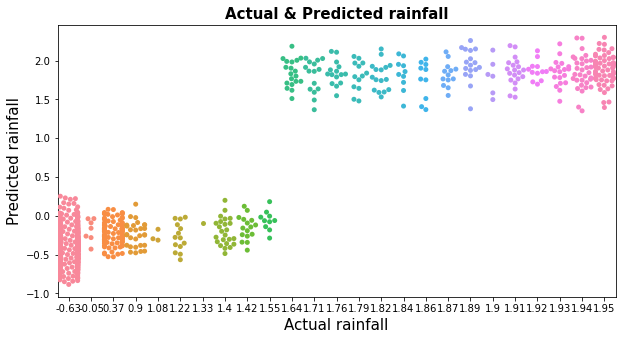

In [181]:
# Let's visualize the variation of actual test data and predicted data
plt.figure(figsize=(10,5))
sns.swarmplot(y_test.round(2), y_pred)
plt.xlabel("Actual rainfall", fontsize= 15)
plt.ylabel("Predicted rainfall",fontsize= 15)
plt.title("Actual & Predicted rainfall" , fontsize= 15, fontweight= 'bold')
plt.show()

In [182]:
print('Final R2 Score:', r2_score(y_test, y_pred))
print('\nFinal Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('\nFinal Mean square error:', mean_squared_error(y_test, y_pred))
print('\nFinal Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))


Final R2 Score: 0.7815011677141492

Final Mean absolute error: 0.32366948456724454

Final Mean square error: 0.22123965041972066

Final Root mean square error: 0.4703611914472969


# Saving Model

In [183]:
import pickle
pickle.dump(lin_reg, open("Rainfall_Regression_model", "wb"))
load_Rainfall_Regression_model= pickle.load(open("Rainfall_Regression_model", "rb"))